In [1]:
import os
import polars as pl
import pyrsm as rsm
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import roc_auc_score, confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

In [2]:
!uv --project /opt/base-uv add pyrsm==2.3.0

Resolved 220 packages in 0.79ms
Audited 203 packages in 0.91ms


In [3]:
## loading the organic data - this dataset must NOT be changed
cg_organic_control = pl.read_parquet("data/cg_organic_control.parquet")
cg_organic_control.head()

converted,GameLevel,NumGameDays,NumGameDays4Plus,NumInGameMessagesSent,NumSpaceHeroBadges,NumFriendRequestIgnored,NumFriends,AcquiredSpaceship,AcquiredIonWeapon,TimesLostSpaceship,TimesKilled,TimesCaptain,TimesNavigator,PurchasedCoinPackSmall,PurchasedCoinPackLarge,NumAdsClicked,DaysUser,UserConsole,UserHasOldOS
cat,i32,i32,i32,i32,i32,i32,i32,cat,cat,i32,i32,i32,i32,cat,cat,i32,i32,cat,cat
"""no""",7,18,0,124,0,81,0,"""yes""","""no""",8,0,0,4,"""no""","""yes""",3,2101,"""no""","""no"""
"""no""",10,3,2,60,0,18,479,"""no""","""no""",10,7,0,0,"""yes""","""no""",7,1644,"""yes""","""no"""
"""no""",2,1,0,0,0,0,0,"""no""","""no""",0,0,0,2,"""no""","""no""",8,3197,"""yes""","""yes"""
"""no""",2,11,1,125,0,73,217,"""no""","""no""",0,0,0,0,"""yes""","""no""",6,913,"""no""","""no"""
"""no""",8,15,0,0,0,6,51,"""yes""","""no""",0,0,2,1,"""yes""","""no""",21,2009,"""yes""","""no"""


In [4]:
rsm.md("data/cg_organic_control_description.md")

## Creative gaming

Game telemetry dataset used for the Creative Gaming: Propensity-to-Buy Modeling case

#### Feature descriptions

* converted: Purchased the Zalon campain ("yes" or "no")
* GameLevel: Highest level of game achieved by the user
* NumGameDays: Number of days user played the game in last month (with or without network connection)
* NumGameDays4Plus: Number of days user played the game in last month with 4 or more total users (this implies using a network connection)
* NumInGameMessagesSent: Number of in-game messages sent to friends
* NumFriends: Number of friends to which the user is connected (necessary to crew together in multiplayer mode) 
* NumFriendRequestIgnored: Number of friend requests this user has not replied to since game inception
* NumSpaceHeroBadges: Number of "Space Hero" badges, the highest distinction for gameplay in Space Pirates
* AcquiredSpaceship: Flag if the user owns a spaceship, i.e., does not have to crew on another user's or NPC's space ship ("no" or "yes")
* AcquiredIonWeapon: Flag if the user owns the powerful "ion weapon" ("no" or "yes")
* TimesLostSpaceship: The number of times the user destroyed his/her spaceship during gameplay. Spaceships need to be re-acquired if destroyed.
* TimesKilled: Number of times the user was killed during gameplay
* TimesCaptain: Number of times in last month that the user played in the role of a captain
* TimesNavigator: Number of times in last month that the user played in the role of a navigator
* PurchasedCoinPackSmall: Flag if the user purchased a small pack of Zathium in last month ("no" or "yes")
* PurchasedCoinPackLarge: Flag if the user purchased a large pack of Zathium in last month ("no" or "yes")
* NumAdsClicked: Number of in-app ads the user has clicked on
* DaysUser: Number of days since user established a user ID with Creative Gaming (for Space Pirates or previous games)
* UserConsole: Flag if the user plays Creative Gaming games on a console ("no" or "yes")
* UserHasOldOS: Flag if the user has iOS version 10 or earlier ("no" or "yes")


In [5]:
## loading the treatment data - this dataset must NOT be changed
cg_ad_treatment = pl.read_parquet("data/cg_ad_treatment.parquet")
cg_ad_treatment.head()

converted,GameLevel,NumGameDays,NumGameDays4Plus,NumInGameMessagesSent,NumSpaceHeroBadges,NumFriendRequestIgnored,NumFriends,AcquiredSpaceship,AcquiredIonWeapon,TimesLostSpaceship,TimesKilled,TimesCaptain,TimesNavigator,PurchasedCoinPackSmall,PurchasedCoinPackLarge,NumAdsClicked,DaysUser,UserConsole,UserHasOldOS,rnd_30k
cat,i32,i32,i32,i32,i32,i32,i32,cat,cat,i32,i32,i32,i32,cat,cat,i32,i32,cat,cat,i32
"""no""",6,16,0,0,0,0,0,"""yes""","""no""",0,0,0,0,"""no""","""no""",11,1827,"""no""","""no""",0
"""no""",2,8,0,0,0,5,4,"""no""","""no""",0,0,8,0,"""yes""","""no""",3,1889,"""no""","""yes""",1
"""no""",6,1,0,0,0,0,0,"""no""","""no""",0,0,0,0,"""no""","""yes""",2,1948,"""yes""","""no""",0
"""yes""",7,16,0,102,1,0,194,"""no""","""no""",0,0,0,0,"""yes""","""yes""",21,3409,"""yes""","""yes""",0
"""no""",10,1,1,233,0,23,0,"""no""","""no""",3,0,5,0,"""no""","""yes""",4,2922,"""yes""","""no""",0


In [6]:
rsm.md("data/cg_ad_treatment_description.md")

## Creative gaming

Game telemetry dataset used for the Creative Gaming: Propensity-to-Buy Modeling case

#### Feature descriptions

* converted: Purchased the Zalon campain ("yes" or "no")
* GameLevel: Highest level of game achieved by the user
* NumGameDays: Number of days user played the game in last month (with or without network connection)
* NumGameDays4Plus: Number of days user played the game in last month with 4 or more total users (this implies using a network connection)
* NumInGameMessagesSent: Number of in-game messages sent to friends
* NumFriends: Number of friends to which the user is connected (necessary to crew together in multiplayer mode) 
* NumFriendRequestIgnored: Number of friend requests this user has not replied to since game inception
* NumSpaceHeroBadges: Number of "Space Hero" badges, the highest distinction for gameplay in Space Pirates
* AcquiredSpaceship: Flag if the user owns a spaceship, i.e., does not have to crew on another user's or NPC's space ship ("no" or "yes")
* AcquiredIonWeapon: Flag if the user owns the powerful "ion weapon" ("no" or "yes")
* TimesLostSpaceship: The number of times the user destroyed his/her spaceship during gameplay. Spaceships need to be re-acquired if destroyed.
* TimesKilled: Number of times the user was killed during gameplay
* TimesCaptain: Number of times in last month that the user played in the role of a captain
* TimesNavigator: Number of times in last month that the user played in the role of a navigator
* PurchasedCoinPackSmall: Flag if the user purchased a small pack of Zathium in last month ("no" or "yes")
* PurchasedCoinPackLarge: Flag if the user purchased a large pack of Zathium in last month ("no" or "yes")
* NumAdsClicked: Number of in-app ads the user has clicked on
* DaysUser: Number of days since user established a user ID with Creative Gaming (for Space Pirates or previous games)
* UserConsole: Flag if the user plays Creative Gaming games on a console ("no" or "yes")
* UserHasOldOS: Flag if the user has iOS version 10 or earlier ("no" or "yes")
* rnd_30k: Dummy variable that randomly selects 30K customers (1) and the remaining 90K (0)


In [7]:
cg_ad_random = pl.read_parquet("data/cg_ad_random.parquet")

# Part 1: Uplift Modeling Using Machine Learning

In [8]:
cg_organic_control = cg_organic_control.with_columns(pl.lit(0).alias("ad"))


cg_ad_random = cg_ad_random.with_columns(pl.lit(1).alias("ad"))


cg_rct_stacked = pl.concat([cg_organic_control, cg_ad_random], how="vertical")
cg_rct_stacked.head()

converted,GameLevel,NumGameDays,NumGameDays4Plus,NumInGameMessagesSent,NumSpaceHeroBadges,NumFriendRequestIgnored,NumFriends,AcquiredSpaceship,AcquiredIonWeapon,TimesLostSpaceship,TimesKilled,TimesCaptain,TimesNavigator,PurchasedCoinPackSmall,PurchasedCoinPackLarge,NumAdsClicked,DaysUser,UserConsole,UserHasOldOS,ad
cat,i32,i32,i32,i32,i32,i32,i32,cat,cat,i32,i32,i32,i32,cat,cat,i32,i32,cat,cat,i32
"""no""",7,18,0,124,0,81,0,"""yes""","""no""",8,0,0,4,"""no""","""yes""",3,2101,"""no""","""no""",0
"""no""",10,3,2,60,0,18,479,"""no""","""no""",10,7,0,0,"""yes""","""no""",7,1644,"""yes""","""no""",0
"""no""",2,1,0,0,0,0,0,"""no""","""no""",0,0,0,2,"""no""","""no""",8,3197,"""yes""","""yes""",0
"""no""",2,11,1,125,0,73,217,"""no""","""no""",0,0,0,0,"""yes""","""no""",6,913,"""no""","""no""",0
"""no""",8,15,0,0,0,6,51,"""yes""","""no""",0,0,2,1,"""yes""","""no""",21,2009,"""yes""","""no""",0


In [9]:
# d
cg_rct_stacked = cg_rct_stacked.with_columns(
    training=rsm.model.make_train(
        cg_rct_stacked,
        strat_var=["converted", "ad"],
        test_size=0.3,
        random_state=1234,
    )
)

In [10]:
cg_rct_stacked

converted,GameLevel,NumGameDays,NumGameDays4Plus,NumInGameMessagesSent,NumSpaceHeroBadges,NumFriendRequestIgnored,NumFriends,AcquiredSpaceship,AcquiredIonWeapon,TimesLostSpaceship,TimesKilled,TimesCaptain,TimesNavigator,PurchasedCoinPackSmall,PurchasedCoinPackLarge,NumAdsClicked,DaysUser,UserConsole,UserHasOldOS,ad,training
cat,i32,i32,i32,i32,i32,i32,i32,cat,cat,i32,i32,i32,i32,cat,cat,i32,i32,cat,cat,i32,i64
"""no""",7,18,0,124,0,81,0,"""yes""","""no""",8,0,0,4,"""no""","""yes""",3,2101,"""no""","""no""",0,1
"""no""",10,3,2,60,0,18,479,"""no""","""no""",10,7,0,0,"""yes""","""no""",7,1644,"""yes""","""no""",0,1
"""no""",2,1,0,0,0,0,0,"""no""","""no""",0,0,0,2,"""no""","""no""",8,3197,"""yes""","""yes""",0,1
"""no""",2,11,1,125,0,73,217,"""no""","""no""",0,0,0,0,"""yes""","""no""",6,913,"""no""","""no""",0,0
"""no""",8,15,0,0,0,6,51,"""yes""","""no""",0,0,2,1,"""yes""","""no""",21,2009,"""yes""","""no""",0,1
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""no""",5,1,0,0,0,0,0,"""no""","""no""",0,0,0,0,"""yes""","""yes""",11,2374,"""no""","""no""",1,0
"""no""",9,12,0,78,0,59,1,"""yes""","""no""",16,0,0,5,"""yes""","""no""",2,1978,"""yes""","""no""",1,1
"""no""",9,19,1,271,0,71,95,"""yes""","""no""",14,0,0,3,"""no""","""no""",2,2831,"""yes""","""yes""",1,1


In [11]:
cg_rct_stacked.group_by(["converted", "ad", "training"]).len().sort(
    ["converted", "ad", "training"]
).pivot(on=["training", "ad"], index="converted")

converted,"{0,0}","{1,0}","{0,1}","{1,1}"
cat,u32,u32,u32,u32
"""no""",8488,19806,7826,18261
"""yes""",512,1194,1174,2739


In [12]:
counts = cg_rct_stacked.group_by(["converted", "ad", "training"]).len()
totals = cg_rct_stacked.group_by(["ad", "training"]).len().rename({"len": "total"})
print(counts, totals)

(
    counts.join(totals, on=["ad", "training"])
    .with_columns((pl.col("len") / pl.col("total")).round(2).alias("prop"))
    .select(["converted", "ad", "training", "prop"])
    .sort(["ad", "training", "converted"])
    .pivot(on=["ad", "training"], index="converted", values="prop")
)

shape: (8, 4)
┌───────────┬─────┬──────────┬───────┐
│ converted ┆ ad  ┆ training ┆ len   │
│ ---       ┆ --- ┆ ---      ┆ ---   │
│ cat       ┆ i32 ┆ i64      ┆ u32   │
╞═══════════╪═════╪══════════╪═══════╡
│ yes       ┆ 1   ┆ 0        ┆ 1174  │
│ yes       ┆ 1   ┆ 1        ┆ 2739  │
│ yes       ┆ 0   ┆ 0        ┆ 512   │
│ no        ┆ 0   ┆ 1        ┆ 19806 │
│ no        ┆ 1   ┆ 0        ┆ 7826  │
│ no        ┆ 0   ┆ 0        ┆ 8488  │
│ yes       ┆ 0   ┆ 1        ┆ 1194  │
│ no        ┆ 1   ┆ 1        ┆ 18261 │
└───────────┴─────┴──────────┴───────┘ shape: (4, 3)
┌─────┬──────────┬───────┐
│ ad  ┆ training ┆ total │
│ --- ┆ ---      ┆ ---   │
│ i32 ┆ i64      ┆ u32   │
╞═════╪══════════╪═══════╡
│ 0   ┆ 0        ┆ 9000  │
│ 1   ┆ 0        ┆ 9000  │
│ 1   ┆ 1        ┆ 21000 │
│ 0   ┆ 1        ┆ 21000 │
└─────┴──────────┴───────┘


converted,"{0,0}","{0,1}","{1,0}","{1,1}"
cat,f64,f64,f64,f64
"""no""",0.94,0.94,0.87,0.87
"""yes""",0.06,0.06,0.13,0.13


At each ad level, the yes/no proportions are similar across training and test (training = 1 versus training = 0)

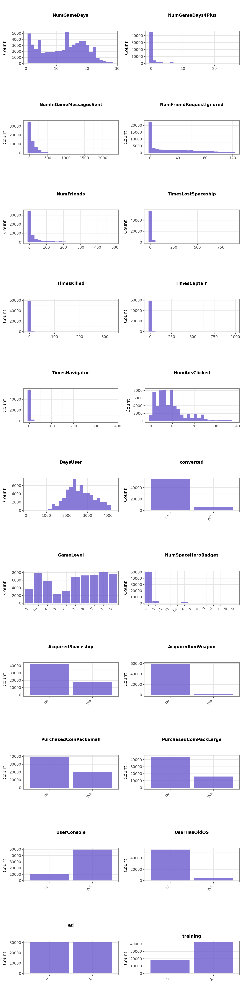

In [13]:
dists = rsm.eda.distr(cg_rct_stacked)
dists.plot()


## 1.2 Logistic Regression

In [14]:
cg_rct_stacked.group_by(["ad", "training"]).len().sort(["ad", "training"]).pivot(
    on="training", index="ad", values="len"
)

ad,0,1
i32,u32,u32
0,9000,21000
1,9000,21000


In [15]:
evar = cg_rct_stacked.columns
evar = [c for c in evar if c not in ["converted", "ad", "training"]]
evar


['GameLevel',
 'NumGameDays',
 'NumGameDays4Plus',
 'NumInGameMessagesSent',
 'NumSpaceHeroBadges',
 'NumFriendRequestIgnored',
 'NumFriends',
 'AcquiredSpaceship',
 'AcquiredIonWeapon',
 'TimesLostSpaceship',
 'TimesKilled',
 'TimesCaptain',
 'TimesNavigator',
 'PurchasedCoinPackSmall',
 'PurchasedCoinPackLarge',
 'NumAdsClicked',
 'DaysUser',
 'UserConsole',
 'UserHasOldOS']

In [16]:
# logistic regression treatment
clf_treatment = rsm.model.logistic(
    data={
        "cg_rct_stacked_uplift": cg_rct_stacked.filter(
            (pl.col("training") == 1) & (pl.col("ad") == 1)
        )
    },
    rvar="converted",
    lev="yes",
    evar=evar,
)
clf_treatment.summary(vif=True)


Logistic regression (GLM)
Data                 : cg_rct_stacked_uplift
Response variable    : converted
Level                : yes
Explanatory variables: GameLevel, NumGameDays, NumGameDays4Plus, NumInGameMessagesSent, NumSpaceHeroBadges, NumFriendRequestIgnored, NumFriends, AcquiredSpaceship, AcquiredIonWeapon, TimesLostSpaceship, TimesKilled, TimesCaptain, TimesNavigator, PurchasedCoinPackSmall, PurchasedCoinPackLarge, NumAdsClicked, DaysUser, UserConsole, UserHasOldOS
Null hyp.: There is no effect of x on converted
Alt. hyp.: There is an effect of x on converted

┌─────────────────────────────┬───────┬────────┬─────────────┬───────────┬─────────┬─────────┬─────┐
│ index                       ┆ OR    ┆ OR%    ┆ coefficient ┆ std.error ┆ z.value ┆ p.value ┆     │
╞═════════════════════════════╪═══════╪════════╪═════════════╪═══════════╪═════════╪═════════╪═════╡
│ Intercept                   ┆ 0.03  ┆ -97.0% ┆ -3.495      ┆ 0.126     ┆ -27.721 ┆ < .001  ┆ *** │
│ AcquiredSpaceship[no]

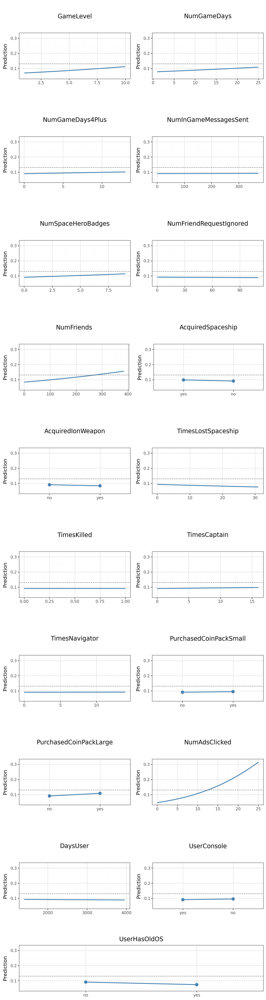

In [17]:
clf_treatment.plot()


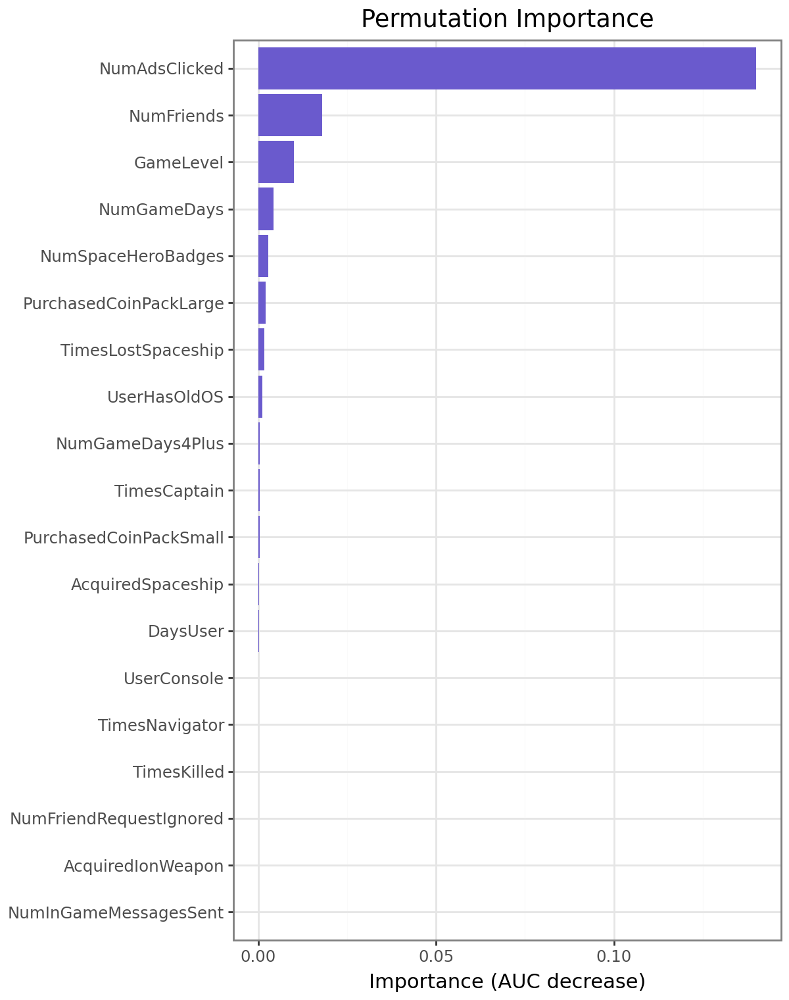

In [18]:
clf_treatment.plot("pip")


In [19]:
rsm.basics.cross_tabs(
    {"cg_rct_stacked": cg_rct_stacked},
    "NumAdsClicked",
    "converted",
).summary()


Cross-tabs
Data     : cg_rct_stacked
Variables: NumAdsClicked, converted
Null hyp : There is no association between NumAdsClicked and converted
Alt. hyp : There is an association between NumAdsClicked and converted

Observed:

┌───────────────┬───────┬──────┬───────┐
│ NumAdsClicked ┆ no    ┆ yes  ┆ Total │
╞═══════════════╪═══════╪══════╪═══════╡
│ 0             ┆ 1544  ┆ 77   ┆ 1621  │
│ 1             ┆ 3475  ┆ 192  ┆ 3667  │
│ 2             ┆ 3730  ┆ 238  ┆ 3968  │
│ 3             ┆ 3729  ┆ 276  ┆ 4005  │
│ 4             ┆ 3673  ┆ 273  ┆ 3946  │
│ …             ┆ …     ┆ …    ┆ …     │
│ 35            ┆ 115   ┆ 42   ┆ 157   │
│ 36            ┆ 87    ┆ 49   ┆ 136   │
│ 37            ┆ 105   ┆ 56   ┆ 161   │
│ 38            ┆ 51    ┆ 24   ┆ 75    │
│ Total         ┆ 54381 ┆ 5619 ┆ 60000 │
└───────────────┴───────┴──────┴───────┘

Expected: (row total x column total) / total

┌───────────────┬─────────┬────────┬─────────┐
│ NumAdsClicked ┆ no      ┆ yes    ┆ Total   │
╞═══════════════

In [20]:
# logistic regression control
clf_control = rsm.model.logistic(
    data={
        "cg_rct_stacked_uplift": cg_rct_stacked.filter(
            (pl.col("training") == 1) & (pl.col("ad") == 0)
        )
    },
    rvar="converted",
    lev="yes",
    evar=evar,
)
clf_treatment.summary(vif=True)


Logistic regression (GLM)
Data                 : cg_rct_stacked_uplift
Response variable    : converted
Level                : yes
Explanatory variables: GameLevel, NumGameDays, NumGameDays4Plus, NumInGameMessagesSent, NumSpaceHeroBadges, NumFriendRequestIgnored, NumFriends, AcquiredSpaceship, AcquiredIonWeapon, TimesLostSpaceship, TimesKilled, TimesCaptain, TimesNavigator, PurchasedCoinPackSmall, PurchasedCoinPackLarge, NumAdsClicked, DaysUser, UserConsole, UserHasOldOS
Null hyp.: There is no effect of x on converted
Alt. hyp.: There is an effect of x on converted

┌─────────────────────────────┬───────┬────────┬─────────────┬───────────┬─────────┬─────────┬─────┐
│ index                       ┆ OR    ┆ OR%    ┆ coefficient ┆ std.error ┆ z.value ┆ p.value ┆     │
╞═════════════════════════════╪═══════╪════════╪═════════════╪═══════════╪═════════╪═════════╪═════╡
│ Intercept                   ┆ 0.03  ┆ -97.0% ┆ -3.495      ┆ 0.126     ┆ -27.721 ┆ < .001  ┆ *** │
│ AcquiredSpaceship[no]

In [21]:
# add predictions and calculate uplift

cg_rct_stacked = cg_rct_stacked.with_columns(
    [
        pl.Series(
            "pred_treatment",
            clf_treatment.predict(cg_rct_stacked)["prediction"],
        ),
        pl.Series(
            "pred_control",
            clf_control.predict(cg_rct_stacked)["prediction"],
        ),
    ]
)

cg_rct_stacked = cg_rct_stacked.with_columns(
    (pl.col("pred_treatment") - pl.col("pred_control")).alias("uplift_score")
)

cg_rct_stacked.head()

converted,GameLevel,NumGameDays,NumGameDays4Plus,NumInGameMessagesSent,NumSpaceHeroBadges,NumFriendRequestIgnored,NumFriends,AcquiredSpaceship,AcquiredIonWeapon,TimesLostSpaceship,TimesKilled,TimesCaptain,TimesNavigator,PurchasedCoinPackSmall,PurchasedCoinPackLarge,NumAdsClicked,DaysUser,UserConsole,UserHasOldOS,ad,training,pred_treatment,pred_control,uplift_score
cat,i32,i32,i32,i32,i32,i32,i32,cat,cat,i32,i32,i32,i32,cat,cat,i32,i32,cat,cat,i32,i64,f64,f64,f64
"""no""",7,18,0,124,0,81,0,"""yes""","""no""",8,0,0,4,"""no""","""yes""",3,2101,"""no""","""no""",0,1,0.082031,0.018729,0.063302
"""no""",10,3,2,60,0,18,479,"""no""","""no""",10,7,0,0,"""yes""","""no""",7,1644,"""yes""","""no""",0,1,0.186298,0.03572,0.150578
"""no""",2,1,0,0,0,0,0,"""no""","""no""",0,0,0,2,"""no""","""no""",8,3197,"""yes""","""yes""",0,1,0.047125,0.012379,0.034746
"""no""",2,11,1,125,0,73,217,"""no""","""no""",0,0,0,0,"""yes""","""no""",6,913,"""no""","""no""",0,0,0.092398,0.010224,0.082174
"""no""",8,15,0,0,0,6,51,"""yes""","""no""",0,0,2,1,"""yes""","""no""",21,2009,"""yes""","""no""",0,1,0.307346,0.088581,0.218765


## 1.3 Calculate Uplift % and Incremental Uplift

In [22]:
tab = rsm.model.uplift_tab(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    "uplift_score",
    "ad",
    1,
    qnt=20,
)
tab

pred,bins,cum_prop,T_resp,T_n,C_resp,C_n,incremental_resp,inc_uplift,uplift
str,i64,f64,u32,u32,u32,u32,f64,f64,f64
"""uplift_score""",1,0.05,197,450,70,634,147.315457,1.636838,0.327368
"""uplift_score""",2,0.1,309,900,99,1182,233.619289,2.59577,0.195969
"""uplift_score""",3,0.15,428,1350,125,1686,327.911032,3.643456,0.212857
"""uplift_score""",4,0.2,528,1800,152,2175,402.206897,4.468966,0.167007
"""uplift_score""",5,0.25,594,2250,166,2684,454.842027,5.0538,0.119162
…,…,…,…,…,…,…,…,…,…
"""uplift_score""",16,0.8,1014,7200,312,7805,726.184497,8.068717,0.042301
"""uplift_score""",17,0.85,1047,7650,319,8224,750.264835,8.336276,0.056627
"""uplift_score""",18,0.9,1079,8100,360,8621,740.756177,8.230624,-0.032163


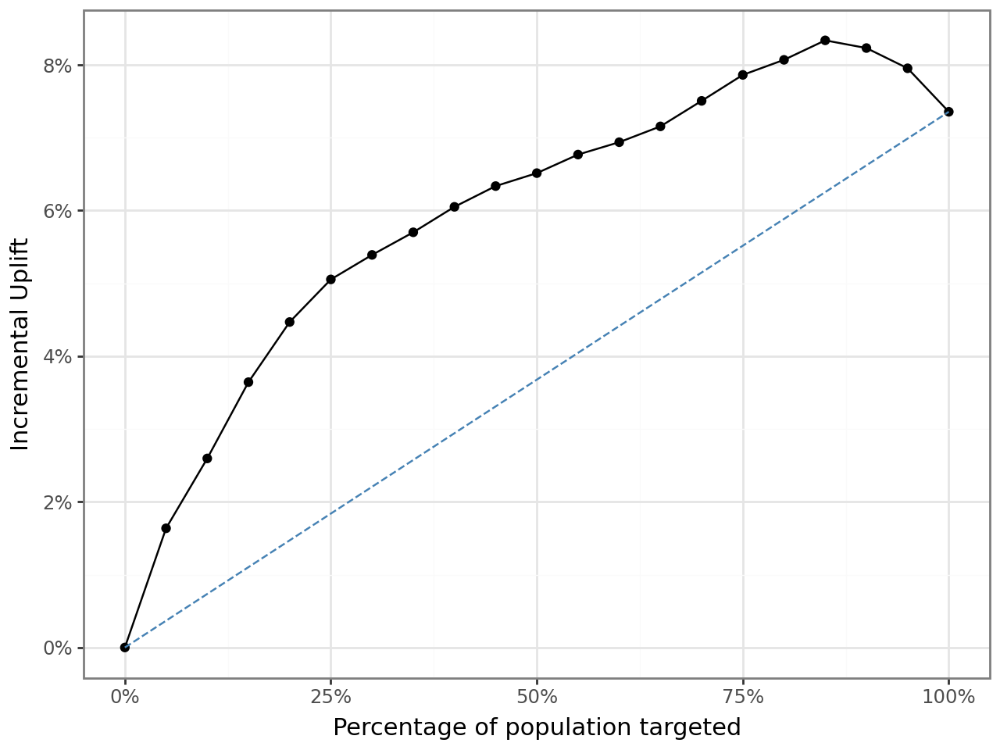

In [23]:
rsm.model.inc_uplift_plot(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    "uplift_score",
    "ad",
    1,
    qnt=20,
)


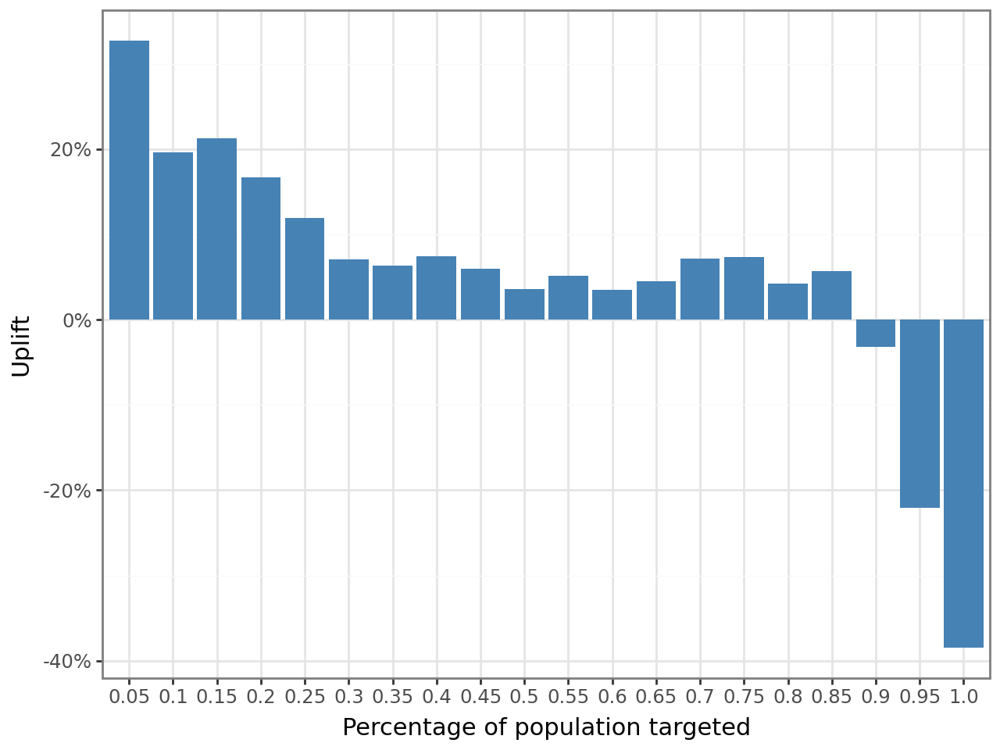

In [24]:
rsm.model.uplift_plot(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    "uplift_score",
    "ad",
    1,
    qnt=20,
)


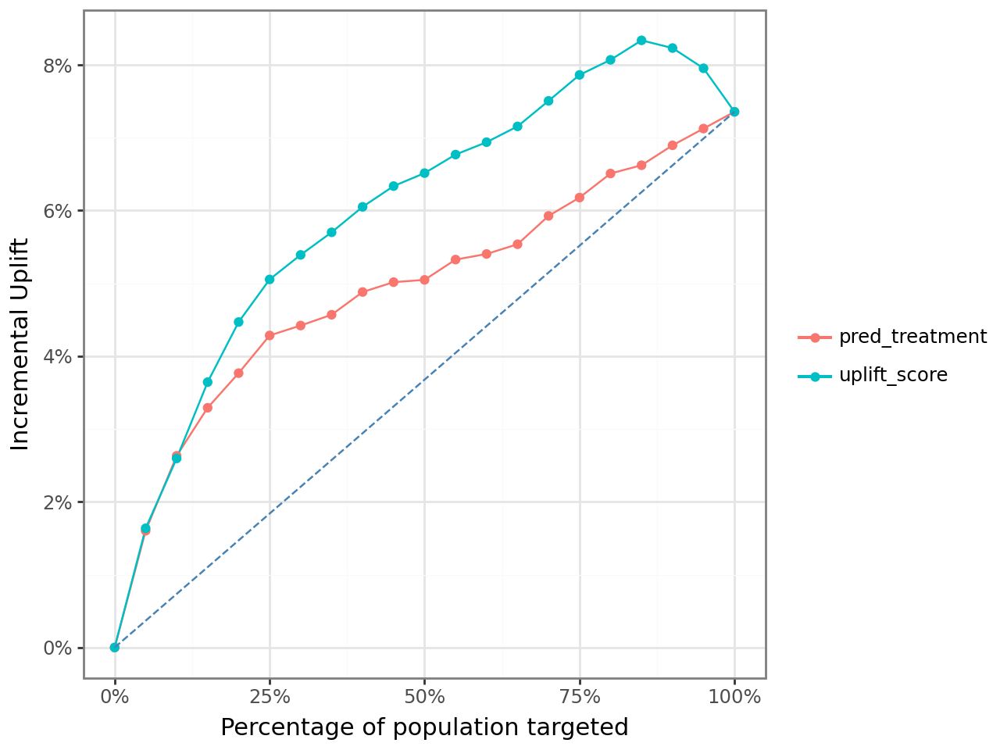

In [25]:
# compare models
rsm.model.inc_uplift_plot(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    ["pred_treatment", "uplift_score"],
    "ad",
    1,
    qnt=20,
)

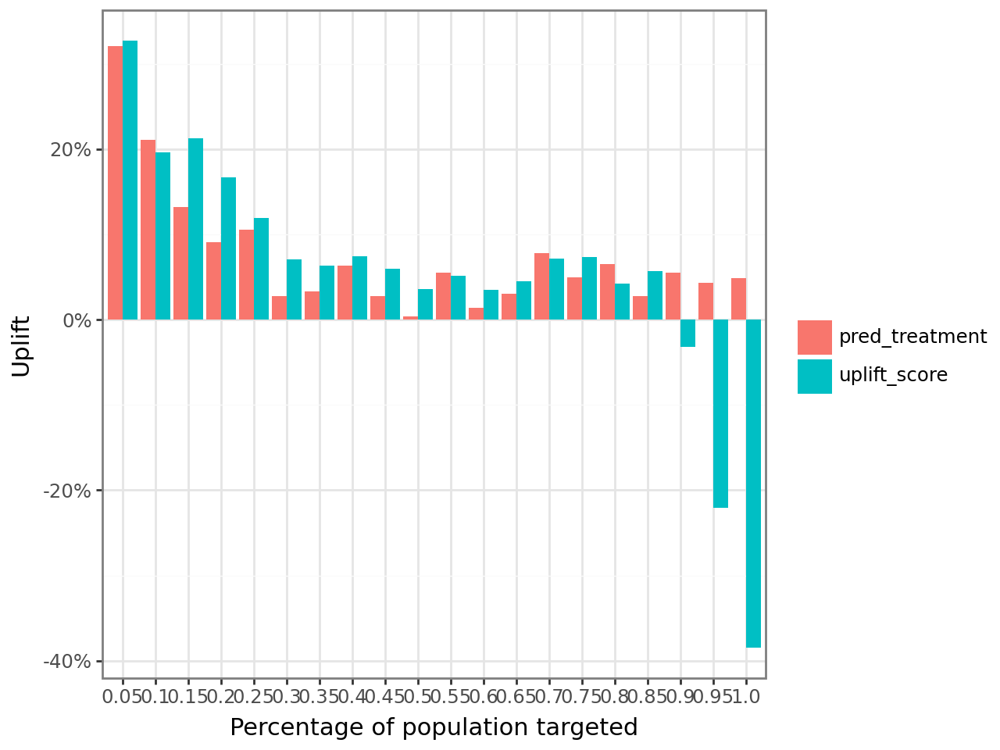

In [26]:
rsm.model.uplift_plot(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    ["pred_treatment", "uplift_score"],
    "ad",
    1,
    qnt=20,
)


Uplift model places high-incrementality customers earlier

In [27]:
test_data = cg_rct_stacked.filter(pl.col("training") == 0).select(
    ["pred_treatment", "pred_control", "uplift_score"]
)
cm = rsm.basics.correlation({"cg_rct_stacked": test_data})
cm.summary()

Correlation
Data     : cg_rct_stacked
Method   : pearson
Cutoff   : 0
Variables: pred_treatment, pred_control, uplift_score
Null hyp.: variables x and y are not correlated
Alt. hyp.: variables x and y are correlated

Correlation matrix:
┌──────────────┬────────────────┬──────────────┐
│              ┆ pred_treatment ┆ pred_control │
╞══════════════╪════════════════╪══════════════╡
│ pred_control ┆ 0.28           ┆              │
│ uplift_score ┆ 0.55           ┆ -0.65        │
└──────────────┴────────────────┴──────────────┘

p.values:
┌──────────────┬────────────────┬──────────────┐
│              ┆ pred_treatment ┆ pred_control │
╞══════════════╪════════════════╪══════════════╡
│ pred_control ┆ 0.0            ┆              │
│ uplift_score ┆ 0.0            ┆ 0.0          │
└──────────────┴────────────────┴──────────────┘


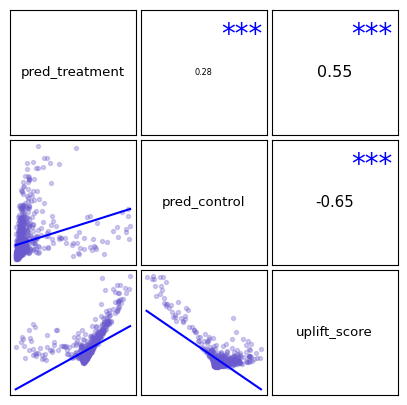

In [28]:
cm.plot()


In [29]:
tab = rsm.model.uplift_tab(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    "uplift_score",
    "ad",
    1,
    qnt=20,
)
tab


pred,bins,cum_prop,T_resp,T_n,C_resp,C_n,incremental_resp,inc_uplift,uplift
str,i64,f64,u32,u32,u32,u32,f64,f64,f64
"""uplift_score""",1,0.05,197,450,70,634,147.315457,1.636838,0.327368
"""uplift_score""",2,0.1,309,900,99,1182,233.619289,2.59577,0.195969
"""uplift_score""",3,0.15,428,1350,125,1686,327.911032,3.643456,0.212857
"""uplift_score""",4,0.2,528,1800,152,2175,402.206897,4.468966,0.167007
"""uplift_score""",5,0.25,594,2250,166,2684,454.842027,5.0538,0.119162
…,…,…,…,…,…,…,…,…,…
"""uplift_score""",16,0.8,1014,7200,312,7805,726.184497,8.068717,0.042301
"""uplift_score""",17,0.85,1047,7650,319,8224,750.264835,8.336276,0.056627
"""uplift_score""",18,0.9,1079,8100,360,8621,740.756177,8.230624,-0.032163


## 1.4 Extrapolate Profit - Uplift

Target best 30,000 of 120,000 customers --> top 25% --> top 5 bins

In [30]:
inc_resp_25pct = tab.filter(pl.col("bins") == 5)["incremental_resp"].item()
inc_resp_25pct

454.8420268256334

In [31]:
test_ad_cust = 9000
scale_factor = 30000 / (test_ad_cust * 0.25)
inc_purch_uplift = inc_resp_25pct * scale_factor
rev_up = 14.99 * inc_purch_uplift
cost_up = 1.5 * 30000
incremental_profit = rev_up - cost_up

print(incremental_profit)

45907.75976154994


## 1.5 Compare Uplift and Propensity Models

#### Calculate Uplift and Incremental Uplift

In [32]:
clf_prop = rsm.model.logistic(
    data={"cg_rct_stacked": cg_rct_stacked.filter(pl.col("training") == 1)},
    rvar="converted",
    lev="yes",
    evar=evar,
)

cg_rct_stacked = cg_rct_stacked.with_columns(
    pl.Series(
        "pred_propensity",
        clf_prop.predict(cg_rct_stacked)["prediction"],
    )
)

uplift_tab_prop = rsm.model.uplift_tab(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    "pred_propensity",
    "ad",
    1,
    qnt=20,
)
uplift_tab_prop


pred,bins,cum_prop,T_resp,T_n,C_resp,C_n,incremental_resp,inc_uplift,uplift
str,i64,f64,u32,u32,u32,u32,f64,f64,f64
"""pred_propensity""",1,0.05,147,450,87,403,49.853598,0.553929,0.110786
"""pred_propensity""",2,0.1,255,900,164,778,65.282776,0.725364,0.034667
"""pred_propensity""",3,0.15,370,1350,213,1189,128.158116,1.423979,0.136334
"""pred_propensity""",4,0.2,467,1800,250,1608,187.149254,2.079436,0.12725
"""pred_propensity""",5,0.25,554,2250,305,2065,221.675545,2.463062,0.072983
…,…,…,…,…,…,…,…,…,…
"""pred_propensity""",16,0.8,1070,7200,492,7181,576.698231,6.407758,0.062429
"""pred_propensity""",17,0.85,1096,7650,501,7651,595.065482,6.611839,0.038629
"""pred_propensity""",18,0.9,1116,8100,508,8111,608.688941,6.76321,0.029227


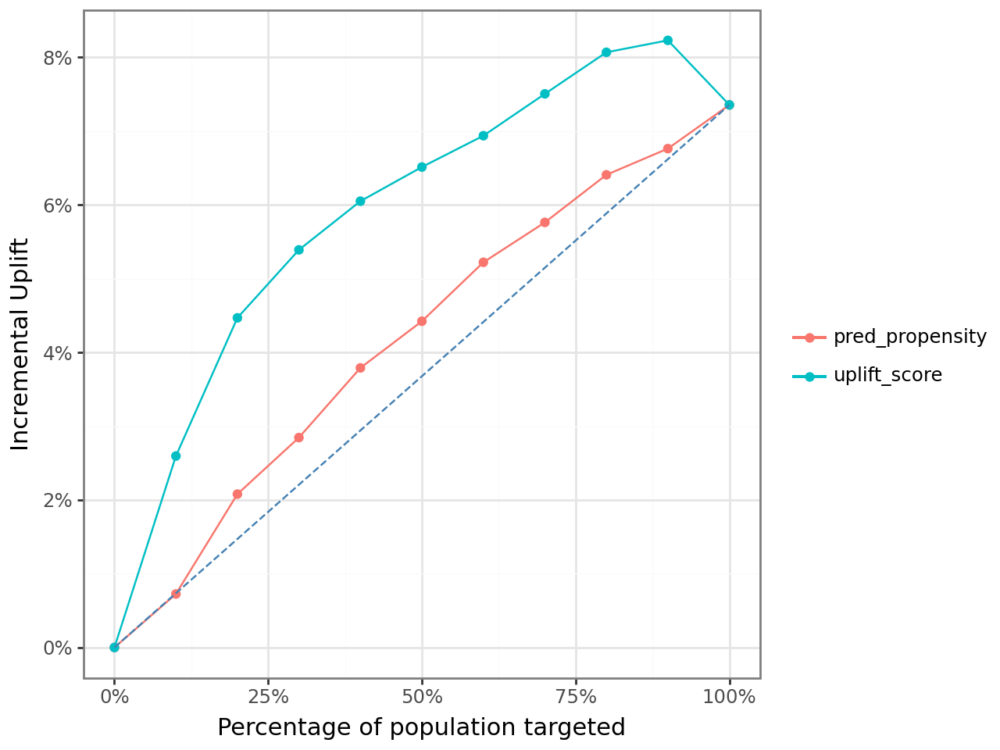

In [33]:
rsm.model.inc_uplift_plot(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    ["pred_propensity", "uplift_score"],
    "ad",
    1,
    20,
)

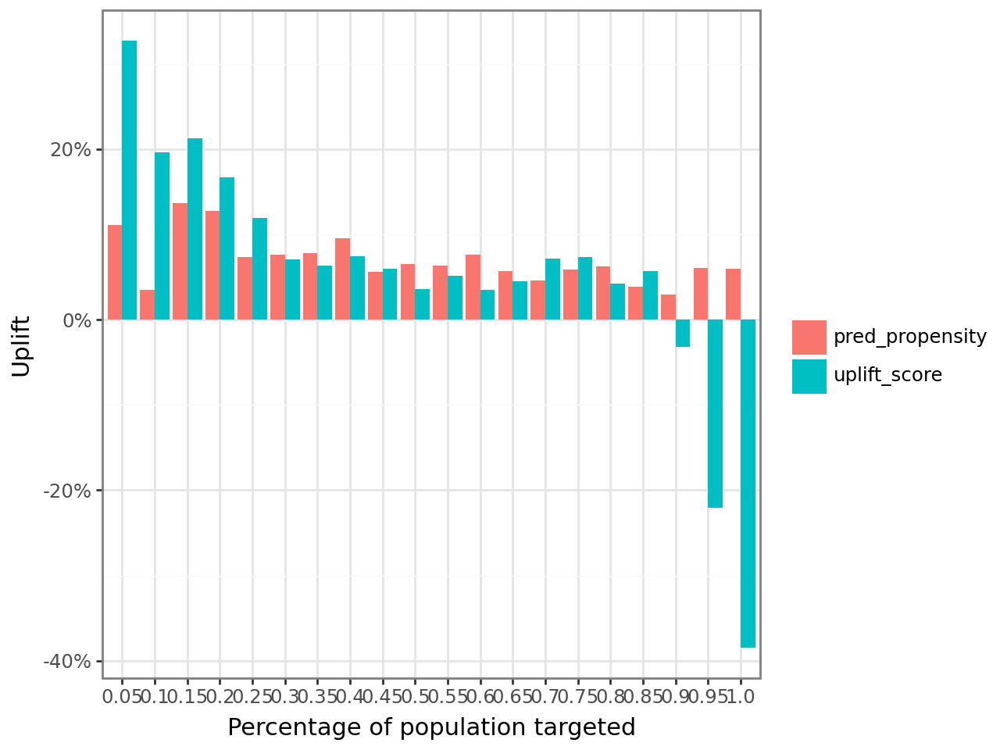

In [34]:
rsm.model.uplift_plot(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    ["pred_propensity", "uplift_score"],
    "ad",
    1,
    20,
)


The uplift model notes that some customers are no longer benefitting from the ad contact (in fact, the action is losing value). The propensity-to-buy model still implies we should target these people, which we can see would actually hurt the business as we may lose the customers with negative uplift as a result.

## 1.6 Extrapolate Profit - Propensity Model

In [35]:
inc_resp_25pct_prop = uplift_tab_prop.filter(pl.col("bins") == 5)[
    "incremental_resp"
].item()
test_ad_cust = 9000
scale_factor = 30000 / (test_ad_cust * 0.25)
inc_purch_prop = inc_resp_25pct_prop * scale_factor
rev_up_prop = 14.99 * inc_purch_prop
cost_up_prop = 1.5 * 30000
incremental_profit_prop = rev_up_prop - cost_up_prop

print(incremental_profit_prop)


-694.4477804681228


## 1.7 Neural Network

In [36]:
# mlp treatment
clf_mlp_treat = rsm.model.mlp(
    {
        "cg_rct_stacked_train": cg_rct_stacked.filter(
            (pl.col("training") == 1) & (pl.col("ad") == 1)
        )
    },
    hidden_layer_sizes=(3, 3),
    alpha=0.001,
    rvar="converted",
    lev="yes",
    evar=evar,
)
clf_mlp_treat.summary()


Multi-layer Perceptron (NN)
Data                 : cg_rct_stacked_train
Response variable    : converted
Level                : yes
Explanatory variables: GameLevel, NumGameDays, NumGameDays4Plus, NumInGameMessagesSent, NumSpaceHeroBadges, NumFriendRequestIgnored, NumFriends, AcquiredSpaceship, AcquiredIonWeapon, TimesLostSpaceship, TimesKilled, TimesCaptain, TimesNavigator, PurchasedCoinPackSmall, PurchasedCoinPackLarge, NumAdsClicked, DaysUser, UserConsole, UserHasOldOS
Model type           : classification
Nr. of features      : (19, 19)
Nr. of weights       : 76
Nr. of observations  : 21,000
Hidden_layer_sizes   : (3, 3)
Activation function  : tanh
Solver               : lbfgs
Alpha                : 0.001
Batch size           : auto
Learning rate        : 0.001
Maximum iterations   : 1000000
random_state         : 1234
AUC                  : 0.771

Raw data             :
shape: (5, 19)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬─────────

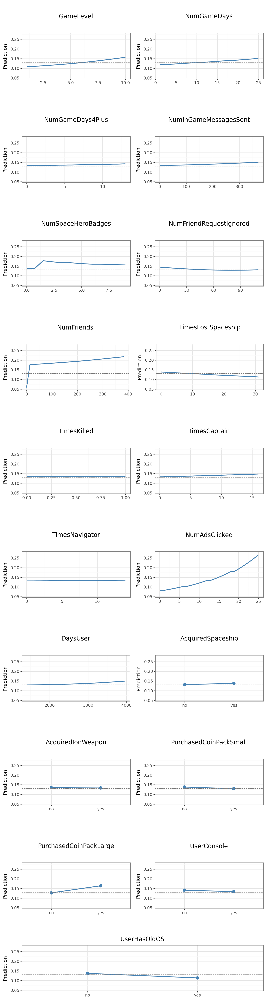

In [37]:
clf_mlp_treat.plot("pdp")

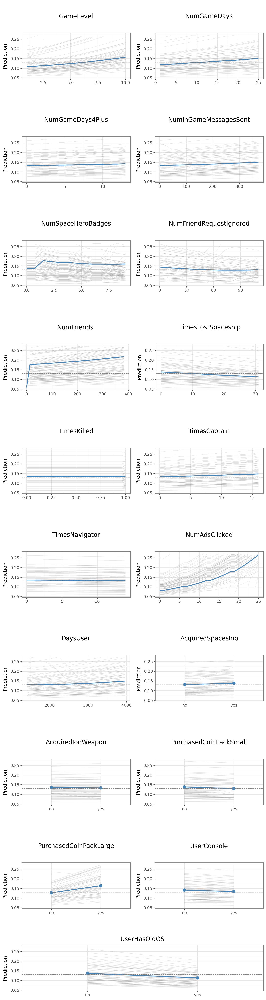

In [38]:
clf_mlp_treat.plot("pdp", ice=True)

/opt/base-uv/.venv/lib/python3.13/site-packages/sklearn/inspection/_partial_dependence.py:721: FutureWarning: The column 13 contains integer data. Partial dependence plots are not supported for integer data: this can lead to implicit rounding with NumPy arrays or even errors with newer pandas versions. Please convert numerical featuresto floating point dtypes ahead of time to avoid problems. This will raise ValueError in scikit-learn 1.9.
/opt/base-uv/.venv/lib/python3.13/site-packages/sklearn/inspection/_partial_dependence.py:721: FutureWarning: The column 14 contains integer data. Partial dependence plots are not supported for integer data: this can lead to implicit rounding with NumPy arrays or even errors with newer pandas versions. Please convert numerical featuresto floating point dtypes ahead of time to avoid problems. This will raise ValueError in scikit-learn 1.9.
/opt/base-uv/.venv/lib/python3.13/site-packages/sklearn/inspection/_partial_dependence.py:721: FutureWarning: The 

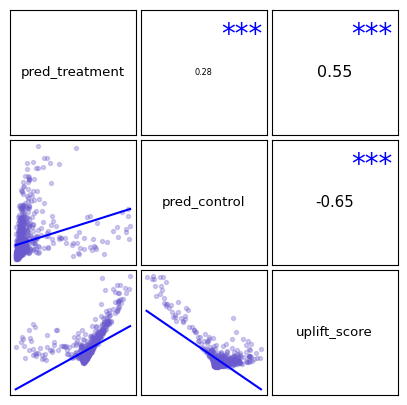

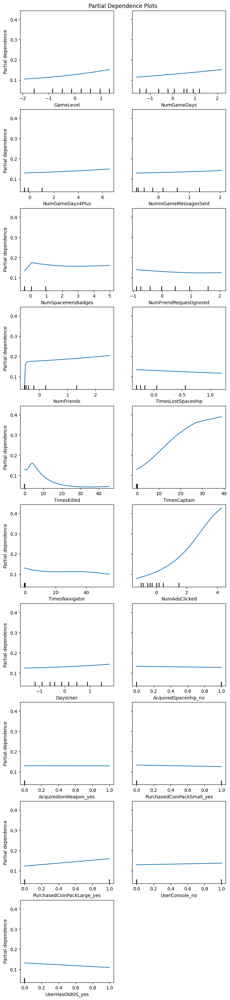

In [39]:
clf_mlp_treat.plot("pdp_sklearn")

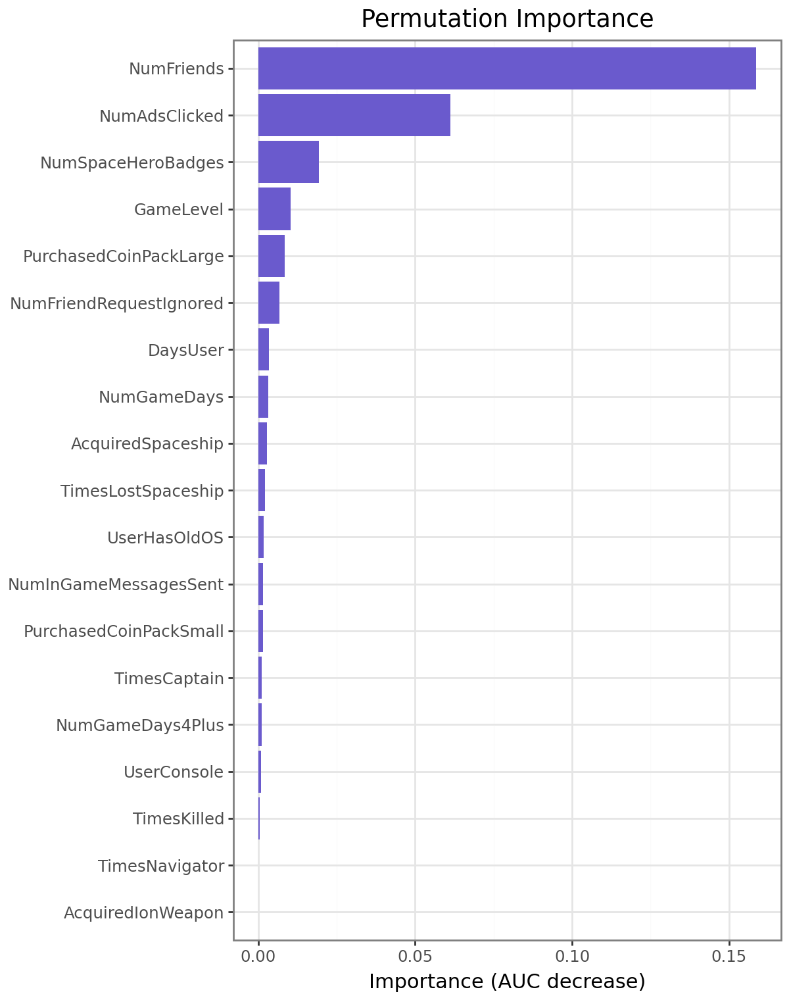

In [40]:
clf_mlp_treat.plot("pip")


In [41]:
# mlp control
clf_mlp_ctrl = rsm.model.mlp(
    {
        "cg_rct_stacked_train": cg_rct_stacked.filter(
            (pl.col("training") == 1) & (pl.col("ad") == 0)
        )
    },
    hidden_layer_sizes=(3, 3),
    alpha=0.001,
    rvar="converted",
    lev="yes",
    evar=evar,
)
clf_mlp_ctrl.summary()


Multi-layer Perceptron (NN)
Data                 : cg_rct_stacked_train
Response variable    : converted
Level                : yes
Explanatory variables: GameLevel, NumGameDays, NumGameDays4Plus, NumInGameMessagesSent, NumSpaceHeroBadges, NumFriendRequestIgnored, NumFriends, AcquiredSpaceship, AcquiredIonWeapon, TimesLostSpaceship, TimesKilled, TimesCaptain, TimesNavigator, PurchasedCoinPackSmall, PurchasedCoinPackLarge, NumAdsClicked, DaysUser, UserConsole, UserHasOldOS
Model type           : classification
Nr. of features      : (19, 19)
Nr. of weights       : 76
Nr. of observations  : 21,000
Hidden_layer_sizes   : (3, 3)
Activation function  : tanh
Solver               : lbfgs
Alpha                : 0.001
Batch size           : auto
Learning rate        : 0.001
Maximum iterations   : 1000000
random_state         : 1234
AUC                  : 0.858

Raw data             :
shape: (5, 19)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬─────────

In [42]:
cg_rct_stacked = cg_rct_stacked.with_columns(
    [
        pl.Series(
            "pred_treat_mlp", clf_mlp_treat.predict(cg_rct_stacked)["prediction"]
        ),
        pl.Series("pred_ctrl_mlp", clf_mlp_ctrl.predict(cg_rct_stacked)["prediction"]),
    ]
)


In [43]:
cg_rct_stacked = cg_rct_stacked.with_columns(
    (pl.col("pred_treat_mlp") - pl.col("pred_ctrl_mlp")).alias("uplift_mlp")
)


In [44]:
tab_mlp = rsm.model.uplift_tab(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    "uplift_mlp",
    "ad",
    1,
    qnt=20,
)
tab_mlp

pred,bins,cum_prop,T_resp,T_n,C_resp,C_n,incremental_resp,inc_uplift,uplift
str,i64,f64,u32,u32,u32,u32,f64,f64,f64
"""uplift_mlp""",1,0.05,200,450,67,636,152.59434,1.695493,0.339099
"""uplift_mlp""",2,0.1,334,900,99,1177,258.299065,2.86999,0.238628
"""uplift_mlp""",3,0.15,459,1350,138,1670,347.443114,3.860479,0.19867
"""uplift_mlp""",4,0.2,541,1800,169,2171,400.88024,4.454225,0.120346
"""uplift_mlp""",5,0.25,626,2250,187,2661,467.882751,5.198697,0.152154
…,…,…,…,…,…,…,…,…,…
"""uplift_mlp""",16,0.8,1036,7200,310,7742,747.702402,8.307804,0.005526
"""uplift_mlp""",17,0.85,1063,7650,321,8197,763.420886,8.482454,0.035824
"""uplift_mlp""",18,0.9,1089,8100,356,8601,753.736659,8.374852,-0.028856


In [45]:
test_size = cg_rct_stacked.filter(pl.col("training") == 0).height


total_inc_resp = (
    tab_mlp.filter(pl.col("bins") <= 5)  # Filter for all bins up to 5
    .select(pl.col("incremental_resp").sum())  # Sum them up
    .item()
)


# scale_factor = Target Total Pop / Actual Test set size
scale_factor = 120_000 / test_size


inc_purchases = total_inc_resp * scale_factor
total_rev = inc_purchases * 14.99
total_cost = 30_000 * 1.50  # Cost for targeting 25% of 120,000 people

final_profit_rf = total_rev - total_cost
print(f"MLP Profit: ${final_profit_rf:,.2f}")


MLP Profit: $117,601.48


## MLP Tuning

In [46]:
param_grid_mlp = {
    "hidden_layer_sizes": [(3, 3), (5, 5), (10, 5), (20, 10)],
    "alpha": [0.0, 0.001, 0.01, 0.1],
}
scoring = {"AUC": "roc_auc"}

### Treatment Tuning

In [47]:
cv_file = "cv-objects/clf-nn-cross-validation-object.pkl"
if os.path.exists(cv_file):
    cv = rsm.notebook.load_state(cv_file)["cv"]
else:
    stratified_k_fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1234)
    cv = GridSearchCV(
        clf_mlp_treat.fitted,
        param_grid_mlp,
        scoring=scoring,
        cv=stratified_k_fold,
        n_jobs=4,
        refit=list(scoring.keys())[0],
        verbose=5,
    ).fit(clf_mlp_treat.data_onehot, clf_mlp_treat.data.get_column("converted"))
    if not os.path.exists("cv-objects"):
        os.mkdir("cv-objects")
    rsm.notebook.save_state({"cv": cv}, cv_file)


Fitting 5 folds for each of 16 candidates, totalling 80 fits


In [48]:
cv_mlp_treat = rsm.model.cross_validation(
    clf_mlp_treat, "clf-nn", param_grid_mlp, scoring
)


The best parameters are: {'alpha': 0.001, 'hidden_layer_sizes': (3, 3)}
The best model fit score is: 0.7620879074633303
The GirdSearchCV model fit estimates:
     mean_fit_time  std_fit_time  mean_score_time  std_score_time  param_alpha  \
4        2.523165      0.578526         0.001711        0.000168        0.001   
8        3.550050      1.244282         0.001702        0.000055        0.010   
12       3.249826      0.964572         0.001701        0.000063        0.100   
0        3.610671      1.020360         0.002237        0.001130        0.000   
13       3.634874      2.906599         0.001779        0.000066        0.100   

   param_hidden_layer_sizes                                          params  \
4                    (3, 3)  {'alpha': 0.001, 'hidden_layer_sizes': (3, 3)}   
8                    (3, 3)   {'alpha': 0.01, 'hidden_layer_sizes': (3, 3)}   
12                   (3, 3)    {'alpha': 0.1, 'hidden_layer_sizes': (3, 3)}   
0                    (3, 3)    {'alpha

In [49]:
cv_mlp_treat.best_params_, cv_mlp_treat.best_score_

({'alpha': 0.001, 'hidden_layer_sizes': (3, 3)},
 np.float64(0.7620879074633303))

In [50]:
pl.DataFrame(cv_mlp_treat.cv_results_).sort("rank_test_AUC").head()

mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,param_hidden_layer_sizes,params,split0_test_AUC,split1_test_AUC,split2_test_AUC,split3_test_AUC,split4_test_AUC,mean_test_AUC,std_test_AUC,rank_test_AUC
f64,f64,f64,f64,f64,object,struct[2],f64,f64,f64,f64,f64,f64,f64,i32
2.523165,0.578526,0.001711,0.000168,0.001,"(3, 3)","{0.001,[3, 3]}",0.751821,0.758501,0.772248,0.767251,0.760619,0.762088,0.007075,1
3.55005,1.244282,0.001702,0.000055,0.01,"(3, 3)","{0.01,[3, 3]}",0.752077,0.757783,0.773441,0.766857,0.759232,0.761878,0.007461,2
3.249826,0.964572,0.001701,0.000063,0.1,"(3, 3)","{0.1,[3, 3]}",0.750861,0.756243,0.77091,0.761167,0.766632,0.761163,0.007145,3
3.610671,1.02036,0.002237,0.00113,0.0,"(3, 3)","{0.0,[3, 3]}",0.749046,0.74614,0.772382,0.760379,0.760249,0.757639,0.009357,4
3.634874,2.906599,0.001779,0.000066,0.1,"(5, 5)","{0.1,[5, 5]}",0.712959,0.765633,0.767309,0.724373,0.762502,0.746555,0.023107,5


In [51]:
clf_mlp_cv_treat = rsm.model.mlp(
    {
        "cg_rct_stacked_train": cg_rct_stacked.filter(
            (pl.col("training") == 1) & (pl.col("ad") == 1)
        )
    },
    rvar="converted",
    lev="yes",
    evar=evar,
    **cv_mlp_treat.best_params_,
    random_state=1234,
)

clf_mlp_cv_treat.summary()


Multi-layer Perceptron (NN)
Data                 : cg_rct_stacked_train
Response variable    : converted
Level                : yes
Explanatory variables: GameLevel, NumGameDays, NumGameDays4Plus, NumInGameMessagesSent, NumSpaceHeroBadges, NumFriendRequestIgnored, NumFriends, AcquiredSpaceship, AcquiredIonWeapon, TimesLostSpaceship, TimesKilled, TimesCaptain, TimesNavigator, PurchasedCoinPackSmall, PurchasedCoinPackLarge, NumAdsClicked, DaysUser, UserConsole, UserHasOldOS
Model type           : classification
Nr. of features      : (19, 19)
Nr. of weights       : 76
Nr. of observations  : 21,000
Hidden_layer_sizes   : (3, 3)
Activation function  : tanh
Solver               : lbfgs
Alpha                : 0.001
Batch size           : auto
Learning rate        : 0.001
Maximum iterations   : 1000000
random_state         : 1234
AUC                  : 0.771

Raw data             :
shape: (5, 19)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬─────────

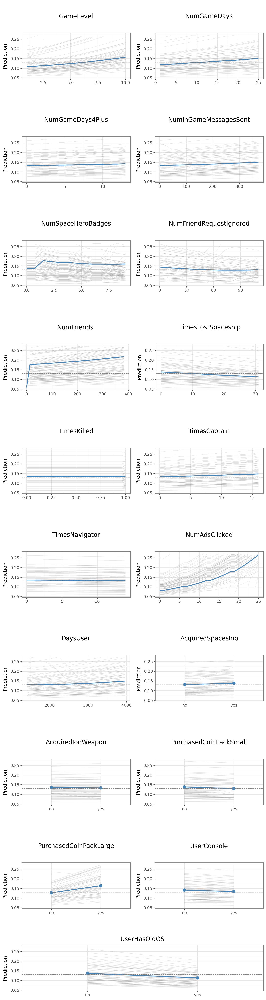

In [52]:
clf_mlp_cv_treat.plot("pdp", ice=True)


In [53]:
pred_mlp_cv_treat = clf_mlp_cv_treat.predict(cg_rct_stacked, dec=3)
cg_rct_stacked = cg_rct_stacked.with_columns(
    mlp_cv_treat=pred_mlp_cv_treat["prediction"]
)


### Control Tuning

In [54]:
cv_file = "cv-objects/clf-nn-cross-validation-object.pkl"
if os.path.exists(cv_file):
    cv = rsm.notebook.load_state(cv_file)["cv"]
else:
    stratified_k_fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1234)
    cv = GridSearchCV(
        clf_mlp_treat.fitted,
        param_grid_mlp,
        scoring=scoring,
        cv=stratified_k_fold,
        n_jobs=4,
        refit=list(scoring.keys())[0],
        verbose=5,
    ).fit(clf_mlp_treat.data_onehot, clf_mlp_treat.data.get_column("converted"))
    if not os.path.exists("cv-objects"):
        os.mkdir("cv-objects")
    rsm.notebook.save_state({"cv": cv}, cv_file)


In [55]:
cv_mlp_ctrl = rsm.model.cross_validation(
    clf_mlp_ctrl, "clf-nn", param_grid_mlp, scoring
)

The best parameters are: {'alpha': 0.001, 'hidden_layer_sizes': (3, 3)}
The best model fit score is: 0.7620879074633303
The GirdSearchCV model fit estimates:
     mean_fit_time  std_fit_time  mean_score_time  std_score_time  param_alpha  \
4        2.523165      0.578526         0.001711        0.000168        0.001   
8        3.550050      1.244282         0.001702        0.000055        0.010   
12       3.249826      0.964572         0.001701        0.000063        0.100   
0        3.610671      1.020360         0.002237        0.001130        0.000   
13       3.634874      2.906599         0.001779        0.000066        0.100   

   param_hidden_layer_sizes                                          params  \
4                    (3, 3)  {'alpha': 0.001, 'hidden_layer_sizes': (3, 3)}   
8                    (3, 3)   {'alpha': 0.01, 'hidden_layer_sizes': (3, 3)}   
12                   (3, 3)    {'alpha': 0.1, 'hidden_layer_sizes': (3, 3)}   
0                    (3, 3)    {'alpha

In [56]:
cv_mlp_ctrl.best_params_, cv_mlp_ctrl.best_score_

({'alpha': 0.001, 'hidden_layer_sizes': (3, 3)},
 np.float64(0.7620879074633303))

In [57]:
pl.DataFrame(cv_mlp_ctrl.cv_results_).sort("rank_test_AUC").head()

mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,param_hidden_layer_sizes,params,split0_test_AUC,split1_test_AUC,split2_test_AUC,split3_test_AUC,split4_test_AUC,mean_test_AUC,std_test_AUC,rank_test_AUC
f64,f64,f64,f64,f64,object,struct[2],f64,f64,f64,f64,f64,f64,f64,i32
2.523165,0.578526,0.001711,0.000168,0.001,"(3, 3)","{0.001,[3, 3]}",0.751821,0.758501,0.772248,0.767251,0.760619,0.762088,0.007075,1
3.55005,1.244282,0.001702,0.000055,0.01,"(3, 3)","{0.01,[3, 3]}",0.752077,0.757783,0.773441,0.766857,0.759232,0.761878,0.007461,2
3.249826,0.964572,0.001701,0.000063,0.1,"(3, 3)","{0.1,[3, 3]}",0.750861,0.756243,0.77091,0.761167,0.766632,0.761163,0.007145,3
3.610671,1.02036,0.002237,0.00113,0.0,"(3, 3)","{0.0,[3, 3]}",0.749046,0.74614,0.772382,0.760379,0.760249,0.757639,0.009357,4
3.634874,2.906599,0.001779,0.000066,0.1,"(5, 5)","{0.1,[5, 5]}",0.712959,0.765633,0.767309,0.724373,0.762502,0.746555,0.023107,5


In [58]:
cv_mlp_cv_ctrl = rsm.model.mlp(
    {
        "cg_rct_stacked_train": cg_rct_stacked.filter(
            (pl.col("training") == 1) & (pl.col("ad") == 0)
        )
    },
    rvar="converted",
    lev="yes",
    evar=evar,
    **cv_mlp_ctrl.best_params_,
    random_state=1234,
)

cv_mlp_cv_ctrl.summary()


Multi-layer Perceptron (NN)
Data                 : cg_rct_stacked_train
Response variable    : converted
Level                : yes
Explanatory variables: GameLevel, NumGameDays, NumGameDays4Plus, NumInGameMessagesSent, NumSpaceHeroBadges, NumFriendRequestIgnored, NumFriends, AcquiredSpaceship, AcquiredIonWeapon, TimesLostSpaceship, TimesKilled, TimesCaptain, TimesNavigator, PurchasedCoinPackSmall, PurchasedCoinPackLarge, NumAdsClicked, DaysUser, UserConsole, UserHasOldOS
Model type           : classification
Nr. of features      : (19, 19)
Nr. of weights       : 76
Nr. of observations  : 21,000
Hidden_layer_sizes   : (3, 3)
Activation function  : tanh
Solver               : lbfgs
Alpha                : 0.001
Batch size           : auto
Learning rate        : 0.001
Maximum iterations   : 1000000
random_state         : 1234
AUC                  : 0.858

Raw data             :
shape: (5, 19)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬──────────┬───────────┬─────────

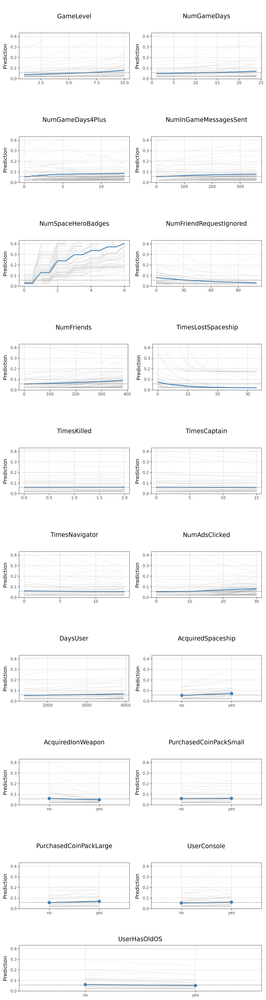

In [59]:
cv_mlp_cv_ctrl.plot("pdp", ice=True)


In [60]:
pred_mlp_cv_ctrl = cv_mlp_cv_ctrl.predict(cg_rct_stacked, dec=3)
cg_rct_stacked = cg_rct_stacked.with_columns(mlp_cv_ctrl=pred_mlp_cv_ctrl["prediction"])


In [136]:
cg_rct_stacked = cg_rct_stacked.with_columns(
    (pl.col("mlp_cv_treat") - pl.col("mlp_cv_ctrl")).alias("uplift_mlp_cv")
)


In [137]:
tab_mlp_cv = rsm.model.uplift_tab(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    "uplift_mlp_cv",
    "ad",
    1,
    qnt=20,
)
tab_mlp_cv

pred,bins,cum_prop,T_resp,T_n,C_resp,C_n,incremental_resp,inc_uplift,uplift
str,i64,f64,u32,u32,u32,u32,f64,f64,f64
"""uplift_mlp_cv""",1,0.05,198,447,67,634,150.76183,1.675131,0.337275
"""uplift_mlp_cv""",2,0.1,333,898,97,1163,258.102322,2.867804,0.242624
"""uplift_mlp_cv""",3,0.15,459,1347,138,1672,347.824163,3.864713,0.200074
"""uplift_mlp_cv""",4,0.2,540,1794,169,2161,399.701064,4.441123,0.117813
"""uplift_mlp_cv""",5,0.25,625,2236,187,2643,466.796443,5.186627,0.154963
…,…,…,…,…,…,…,…,…,…
"""uplift_mlp_cv""",16,0.8,1037,7192,310,7738,748.873869,8.320821,0.00821
"""uplift_mlp_cv""",17,0.85,1063,7647,321,8197,763.538368,8.48376,0.033178
"""uplift_mlp_cv""",18,0.9,1089,8099,356,8602,753.817019,8.375745,-0.028898


In [138]:
inc_resp_25pct_mlp_cv = tab_mlp_cv.filter(pl.col("bins") == 5)[
    "incremental_resp"
].item()
test_ad_cust = 9000
scale_factor = 30000 / (test_ad_cust * 0.25)
inc_purch_cv = inc_resp_25pct_mlp_cv * scale_factor
rev_up_cv = 14.99 * inc_purch_cv
cost_up_cv = 1.5 * 30000
incremental_profit_mlp_cv = rev_up_cv - cost_up_cv

print(incremental_profit_mlp_cv)


48297.04916130661


## 1.8 Random Forest

In [64]:
clf_rf_treat = rsm.model.rforest(
    {
        "cg_rct_stacked_train": cg_rct_stacked.filter(
            (pl.col("training") == 1) & (pl.col("ad") == 1)
        )
    },
    rvar="converted",
    lev="yes",
    evar=evar,
)

clf_rf_treat.summary()


Random Forest
Data                 : cg_rct_stacked_train
Response variable    : converted
Level                : yes
Explanatory variables: GameLevel, NumGameDays, NumGameDays4Plus, NumInGameMessagesSent, NumSpaceHeroBadges, NumFriendRequestIgnored, NumFriends, AcquiredSpaceship, AcquiredIonWeapon, TimesLostSpaceship, TimesKilled, TimesCaptain, TimesNavigator, PurchasedCoinPackSmall, PurchasedCoinPackLarge, NumAdsClicked, DaysUser, UserConsole, UserHasOldOS
OOB                  : True
Model type           : classification
Nr. of features      : (19, 19)
Nr. of observations  : 21,000
max_features         : sqrt (4)
n_estimators         : 100
min_samples_leaf     : 1
max_samples          : 1.0
random_state         : 1234
AUC                  : 0.755

Estimation data      :
shape: (5, 19)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬──────────┐
│ GameLevel ┆ NumGameDa ┆ NumGameDa ┆ NumInGame ┆ … ┆ Purchased ┆ Purchased ┆ UserConso ┆ UserHasO │


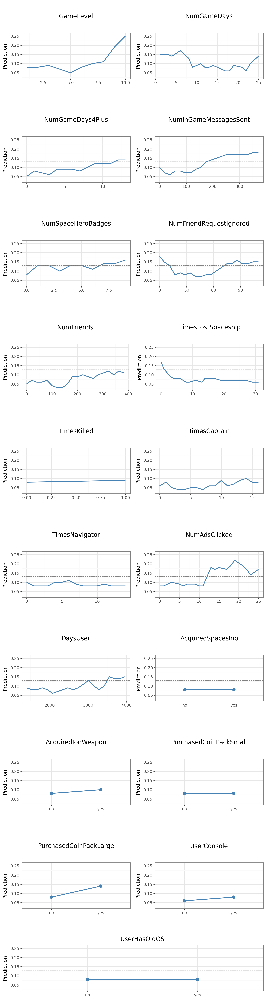

In [65]:
clf_rf_treat.plot("pred")

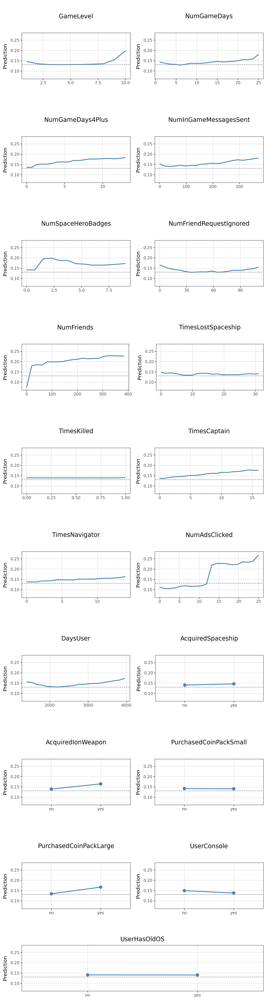

In [66]:
clf_rf_treat.plot("pdp")


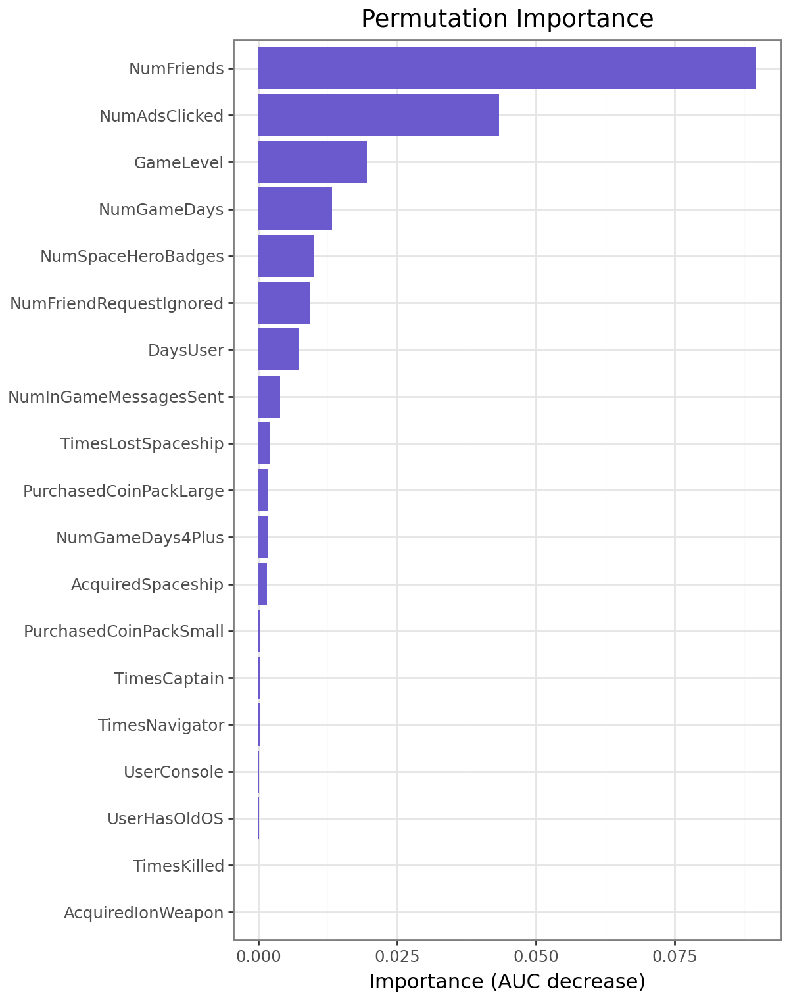

In [67]:
clf_rf_treat.plot("pip")


In [68]:
clf_rf_ctrl = rsm.model.rforest(
    {
        "cg_rct_stacked_train": cg_rct_stacked.filter(
            (pl.col("training") == 1) & (pl.col("ad") == 0)
        )
    },
    rvar="converted",
    lev="yes",
    evar=evar,
)

clf_rf_ctrl.summary()


Random Forest
Data                 : cg_rct_stacked_train
Response variable    : converted
Level                : yes
Explanatory variables: GameLevel, NumGameDays, NumGameDays4Plus, NumInGameMessagesSent, NumSpaceHeroBadges, NumFriendRequestIgnored, NumFriends, AcquiredSpaceship, AcquiredIonWeapon, TimesLostSpaceship, TimesKilled, TimesCaptain, TimesNavigator, PurchasedCoinPackSmall, PurchasedCoinPackLarge, NumAdsClicked, DaysUser, UserConsole, UserHasOldOS
OOB                  : True
Model type           : classification
Nr. of features      : (19, 19)
Nr. of observations  : 21,000
max_features         : sqrt (4)
n_estimators         : 100
min_samples_leaf     : 1
max_samples          : 1.0
random_state         : 1234
AUC                  : 0.852

Estimation data      :
shape: (5, 19)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬──────────┐
│ GameLevel ┆ NumGameDa ┆ NumGameDa ┆ NumInGame ┆ … ┆ Purchased ┆ Purchased ┆ UserConso ┆ UserHasO │


In [69]:
cg_rct_stacked = cg_rct_stacked.with_columns(
    [
        pl.Series("pred_treat_rf", clf_rf_treat.predict(cg_rct_stacked)["prediction"]),
        pl.Series("pred_ctrl_rf", clf_rf_ctrl.predict(cg_rct_stacked)["prediction"]),
    ]
)


In [70]:
cg_rct_stacked = cg_rct_stacked.with_columns(
    (pl.col("pred_treat_rf") - pl.col("pred_ctrl_rf")).alias("uplift_rf")
)


In [71]:
tab_rf = rsm.model.uplift_tab(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    "uplift_rf",
    "ad",
    1,
    qnt=20,
)

tab_rf


pred,bins,cum_prop,T_resp,T_n,C_resp,C_n,incremental_resp,inc_uplift,uplift
str,i64,f64,u32,u32,u32,u32,f64,f64,f64
"""uplift_rf""",1,0.05,204,432,61,568,157.605634,1.751174,0.364828
"""uplift_rf""",2,0.1,342,871,94,1091,266.955087,2.966168,0.251253
"""uplift_rf""",3,0.15,448,1276,114,1585,356.224606,3.958051,0.221243
"""uplift_rf""",4,0.2,568,1796,146,2163,446.772076,4.964134,0.175406
"""uplift_rf""",5,0.25,636,2139,164,2540,497.891339,5.532126,0.150505
…,…,…,…,…,…,…,…,…,…
"""uplift_rf""",16,0.75,999,6819,291,7511,734.810278,8.164559,0.022951
"""uplift_rf""",17,0.8,1035,7647,305,8306,754.198772,8.379986,0.025868
"""uplift_rf""",18,0.85,1084,8091,346,8645,760.172817,8.446365,-0.010584


In [72]:
inc_resp_25pct_rf = tab_rf.filter(pl.col("bins") == 5)["incremental_resp"].item()
test_ad_cust = 9000
scale_factor = 30000 / (test_ad_cust * 0.25)
inc_purch_rf = inc_resp_25pct_rf * scale_factor
rev_up_rf = 14.99 * inc_purch_rf
cost_up_rf = 1.5 * 30000
incremental_profit_rf = rev_up_rf - cost_up_rf

print(incremental_profit_rf)


54511.88220472442


## Random Forest Tuning

In [73]:
param_grid_rf = {
    "max_features": list(range(1, 5)),
    "n_estimators": pl.arange(100, 600, 100, eager=True).to_list(),
}
scoring = {"AUC": "roc_auc"}
param_grid_rf

{'max_features': [1, 2, 3, 4], 'n_estimators': [100, 200, 300, 400, 500]}

## Treatment Tuning

In [74]:
# cv_file = "cv-objects/clf-rf-cross-validation-object.pkl"
# if os.path.exists(cv_file):
#     cv = rsm.notebook.load_state(cv_file)["cv"]
# else:
#     stratified_k_fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1234)
#     cv = GridSearchCV(
#         clf_rf_treat.fitted,
#         param_grid,
#         scoring=scoring,
#         cv=stratified_k_fold,
#         n_jobs=4,
#         refit=list(scoring.keys())[0],
#         verbose=5,
#     ).fit(clf_rf_treat.data_onehot, clf_rf_treat.data.get_column("converted"))
#     if not os.path.exists("cv-objects"):
#         os.mkdir("cv-objects")
#     rsm.notebook.save_state({"cv": cv}, cv_file)


In [75]:
cv_rf_treat = rsm.model.cross_validation(
    rsm.model.rforest(
        {
            "cg_rct_stacked_train": cg_rct_stacked.filter(
                (pl.col("training") == 1) & (pl.col("ad") == 1)
            )
        },
        rvar="converted",
        lev="yes",
        evar=evar,
    ),
    name="rf_treat",
    param_grid=param_grid_rf,
    scoring={"AUC": "roc_auc"},
)


Fitting 5 folds for each of 20 candidates, totalling 100 fits
The best parameters are: {'max_features': 3, 'n_estimators': 400}
The best model fit score is: 0.7759752589707409
The GirdSearchCV model fit estimates:
     mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
13       3.875645      0.025414         0.146457        0.001046   
12       3.009404      0.064978         0.109694        0.000713   
14       4.825340      0.021879         0.181129        0.001039   
9        3.957223      0.035834         0.189445        0.000596   
11       2.054657      0.054572         0.076055        0.002917   

    param_max_features  param_n_estimators  \
13                   3                 400   
12                   3                 300   
14                   3                 500   
9                    2                 500   
11                   3                 200   

                                      params  split0_test_AUC  \
13  {'max_features': 3, 'n_estimat

In [76]:
cv_rf_treat.best_params_


{'max_features': 3, 'n_estimators': 400}

In [77]:
cv_rf_treat.best_score_


np.float64(0.7759752589707409)

In [78]:
pl.DataFrame(cv_rf_treat.cv_results_).sort("rank_test_AUC").head()


mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,param_n_estimators,params,split0_test_AUC,split1_test_AUC,split2_test_AUC,split3_test_AUC,split4_test_AUC,mean_test_AUC,std_test_AUC,rank_test_AUC
f64,f64,f64,f64,i64,i64,struct[2],f64,f64,f64,f64,f64,f64,f64,i32
3.875645,0.025414,0.146457,0.001046,3,400,"{3,400}",0.765671,0.773089,0.790712,0.781485,0.768919,0.775975,0.009076,1
3.009404,0.064978,0.109694,0.000713,3,300,"{3,300}",0.76537,0.772039,0.79079,0.780814,0.767861,0.775375,0.009326,2
4.82534,0.021879,0.181129,0.001039,3,500,"{3,500}",0.764824,0.772664,0.789804,0.780063,0.769507,0.775372,0.008755,3
3.957223,0.035834,0.189445,0.000596,2,500,"{2,500}",0.760217,0.767836,0.789817,0.779709,0.770106,0.773537,0.010245,4
2.054657,0.054572,0.076055,0.002917,3,200,"{3,200}",0.761043,0.772793,0.788664,0.780194,0.764576,0.773454,0.0101,5


In [79]:
clf_rfcv_treat = rsm.model.rforest(
    {
        "cg_rct_stacked_train": cg_rct_stacked.filter(
            (pl.col("training") == 1) & (pl.col("ad") == 1)
        )
    },
    rvar="converted",
    lev="yes",
    evar=evar,
    random_state=1234,
    **cv_rf_treat.best_params_,
)


clf_rfcv_treat.summary()


Random Forest
Data                 : cg_rct_stacked_train
Response variable    : converted
Level                : yes
Explanatory variables: GameLevel, NumGameDays, NumGameDays4Plus, NumInGameMessagesSent, NumSpaceHeroBadges, NumFriendRequestIgnored, NumFriends, AcquiredSpaceship, AcquiredIonWeapon, TimesLostSpaceship, TimesKilled, TimesCaptain, TimesNavigator, PurchasedCoinPackSmall, PurchasedCoinPackLarge, NumAdsClicked, DaysUser, UserConsole, UserHasOldOS
OOB                  : True
Model type           : classification
Nr. of features      : (19, 19)
Nr. of observations  : 21,000
max_features         : 3 (3)
n_estimators         : 400
min_samples_leaf     : 1
max_samples          : 1.0
random_state         : 1234
AUC                  : 0.775

Estimation data      :
shape: (5, 19)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬──────────┐
│ GameLevel ┆ NumGameDa ┆ NumGameDa ┆ NumInGame ┆ … ┆ Purchased ┆ Purchased ┆ UserConso ┆ UserHasO │
│ -

In [80]:
cg_rct_stacked = cg_rct_stacked.with_columns(
    pred_rfcv_treat=clf_rfcv_treat.predict(cg_rct_stacked).get_column("prediction")
)
cg_rct_stacked

converted,GameLevel,NumGameDays,NumGameDays4Plus,NumInGameMessagesSent,NumSpaceHeroBadges,NumFriendRequestIgnored,NumFriends,AcquiredSpaceship,AcquiredIonWeapon,TimesLostSpaceship,TimesKilled,TimesCaptain,TimesNavigator,PurchasedCoinPackSmall,PurchasedCoinPackLarge,NumAdsClicked,DaysUser,UserConsole,UserHasOldOS,ad,training,pred_treatment,pred_control,uplift_score,pred_propensity,pred_treat_mlp,pred_ctrl_mlp,uplift_mlp,mlp_cv_treat,mlp_cv_ctrl,uplift_mlp_cv,pred_treat_rf,pred_ctrl_rf,uplift_rf,pred_rfcv_treat
cat,i32,i32,i32,i32,i32,i32,i32,cat,cat,i32,i32,i32,i32,cat,cat,i32,i32,cat,cat,i32,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""no""",7,18,0,124,0,81,0,"""yes""","""no""",8,0,0,4,"""no""","""yes""",3,2101,"""no""","""no""",0,1,0.082031,0.018729,0.063302,0.053649,0.007597,0.007333,0.000264,0.008,0.007,-0.001,0.02,0.0,0.02,0.0125
"""no""",10,3,2,60,0,18,479,"""no""","""no""",10,7,0,0,"""yes""","""no""",7,1644,"""yes""","""no""",0,1,0.186298,0.03572,0.150578,0.106834,0.144713,0.037292,0.10742,0.145,0.037,-0.108,0.28,0.06,0.22,0.23
"""no""",2,1,0,0,0,0,0,"""no""","""no""",0,0,0,2,"""no""","""no""",8,3197,"""yes""","""yes""",0,1,0.047125,0.012379,0.034746,0.030954,0.034659,0.009353,0.025306,0.035,0.009,-0.026,0.07,0.0,0.07,0.03
"""no""",2,11,1,125,0,73,217,"""no""","""no""",0,0,0,0,"""yes""","""no""",6,913,"""no""","""no""",0,0,0.092398,0.010224,0.082174,0.045765,0.080824,0.007168,0.073655,0.081,0.007,-0.074,0.22,0.02,0.2,0.215
"""no""",8,15,0,0,0,6,51,"""yes""","""no""",0,0,2,1,"""yes""","""no""",21,2009,"""yes""","""no""",0,1,0.307346,0.088581,0.218765,0.176762,0.294274,0.136737,0.157536,0.294,0.137,-0.157,0.31,0.0,0.31,0.3175
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""no""",5,1,0,0,0,0,0,"""no""","""no""",0,0,0,0,"""yes""","""yes""",11,2374,"""no""","""no""",1,0,0.115326,0.024719,0.090608,0.068181,0.04193,0.00839,0.033541,0.042,0.008,-0.034,0.08,0.0,0.08,0.0375
"""no""",9,12,0,78,0,59,1,"""yes""","""no""",16,0,0,5,"""yes""","""no""",2,1978,"""yes""","""no""",1,1,0.061149,0.01237,0.048779,0.040209,0.073642,0.007202,0.06644,0.074,0.007,-0.067,0.04,0.03,0.01,0.005
"""no""",9,19,1,271,0,71,95,"""yes""","""no""",14,0,0,3,"""no""","""no""",2,2831,"""yes""","""yes""",1,1,0.062747,0.021071,0.041676,0.046537,0.106722,0.017778,0.088944,0.107,0.018,-0.089,0.03,0.02,0.01,0.03


## Control Tuning

In [81]:
# cv_file = "cv-objects/clf-rf-cross-validation-object.pkl"
# if os.path.exists(cv_file):
#     cv = rsm.notebook.load_state(cv_file)["cv"]
# else:
#     stratified_k_fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1234)
#     cv = GridSearchCV(
#         clf_rf_treat.fitted,
#         param_grid,
#         scoring=scoring,
#         cv=stratified_k_fold,
#         n_jobs=4,
#         refit=list(scoring.keys())[0],
#         verbose=5,
#     ).fit(clf_rf_treat.data_onehot, clf_rf_treat.data.get_column("converted"))
#     if not os.path.exists("cv-objects"):
#         os.mkdir("cv-objects")
#     rsm.notebook.save_state({"cv": cv}, cv_file)


In [82]:
cv_rf_ctrl = rsm.model.cross_validation(
    rsm.model.rforest(
        {
            "cg_rct_stacked_train": cg_rct_stacked.filter(
                (pl.col("training") == 1) & (pl.col("ad") == 0)
            )
        },
        rvar="converted",
        lev="yes",
        evar=evar,
    ),
    name="rf_treat",
    param_grid=param_grid_rf,
    scoring={"AUC": "roc_auc"},
)


The best parameters are: {'max_features': 3, 'n_estimators': 400}
The best model fit score is: 0.7759752589707409
The GirdSearchCV model fit estimates:
     mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
13       3.875645      0.025414         0.146457        0.001046   
12       3.009404      0.064978         0.109694        0.000713   
14       4.825340      0.021879         0.181129        0.001039   
9        3.957223      0.035834         0.189445        0.000596   
11       2.054657      0.054572         0.076055        0.002917   

    param_max_features  param_n_estimators  \
13                   3                 400   
12                   3                 300   
14                   3                 500   
9                    2                 500   
11                   3                 200   

                                      params  split0_test_AUC  \
13  {'max_features': 3, 'n_estimators': 400}         0.765671   
12  {'max_features': 3, 'n_esti

In [83]:
cv_rf_ctrl.best_params_


{'max_features': 3, 'n_estimators': 400}

In [84]:
cv_rf_ctrl.best_score_


np.float64(0.7759752589707409)

In [85]:
pl.DataFrame(cv_rf_ctrl.cv_results_).sort("rank_test_AUC").head()


mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,param_n_estimators,params,split0_test_AUC,split1_test_AUC,split2_test_AUC,split3_test_AUC,split4_test_AUC,mean_test_AUC,std_test_AUC,rank_test_AUC
f64,f64,f64,f64,i64,i64,struct[2],f64,f64,f64,f64,f64,f64,f64,i32
3.875645,0.025414,0.146457,0.001046,3,400,"{3,400}",0.765671,0.773089,0.790712,0.781485,0.768919,0.775975,0.009076,1
3.009404,0.064978,0.109694,0.000713,3,300,"{3,300}",0.76537,0.772039,0.79079,0.780814,0.767861,0.775375,0.009326,2
4.82534,0.021879,0.181129,0.001039,3,500,"{3,500}",0.764824,0.772664,0.789804,0.780063,0.769507,0.775372,0.008755,3
3.957223,0.035834,0.189445,0.000596,2,500,"{2,500}",0.760217,0.767836,0.789817,0.779709,0.770106,0.773537,0.010245,4
2.054657,0.054572,0.076055,0.002917,3,200,"{3,200}",0.761043,0.772793,0.788664,0.780194,0.764576,0.773454,0.0101,5


In [86]:
clf_rfcv_ctrl = rsm.model.rforest(
    {
        "cg_rct_stacked_train": cg_rct_stacked.filter(
            (pl.col("training") == 1) & (pl.col("ad") == 0)
        )
    },
    rvar="converted",
    lev="yes",
    evar=evar,
    random_state=1234,
    **cv_rf_ctrl.best_params_,
)


clf_rfcv_ctrl.summary()


Random Forest
Data                 : cg_rct_stacked_train
Response variable    : converted
Level                : yes
Explanatory variables: GameLevel, NumGameDays, NumGameDays4Plus, NumInGameMessagesSent, NumSpaceHeroBadges, NumFriendRequestIgnored, NumFriends, AcquiredSpaceship, AcquiredIonWeapon, TimesLostSpaceship, TimesKilled, TimesCaptain, TimesNavigator, PurchasedCoinPackSmall, PurchasedCoinPackLarge, NumAdsClicked, DaysUser, UserConsole, UserHasOldOS
OOB                  : True
Model type           : classification
Nr. of features      : (19, 19)
Nr. of observations  : 21,000
max_features         : 3 (3)
n_estimators         : 400
min_samples_leaf     : 1
max_samples          : 1.0
random_state         : 1234
AUC                  : 0.872

Estimation data      :
shape: (5, 19)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬──────────┐
│ GameLevel ┆ NumGameDa ┆ NumGameDa ┆ NumInGame ┆ … ┆ Purchased ┆ Purchased ┆ UserConso ┆ UserHasO │
│ -

In [87]:
cg_rct_stacked = cg_rct_stacked.with_columns(
    [
        pl.Series(
            "pred_treat_rf_cv", clf_rfcv_treat.predict(cg_rct_stacked)["prediction"]
        ),
        pl.Series(
            "pred_ctrl_rf_cv", clf_rfcv_ctrl.predict(cg_rct_stacked)["prediction"]
        ),
    ]
)


In [88]:
cg_rct_stacked = cg_rct_stacked.with_columns(
    (pl.col("pred_treat_rf_cv") - pl.col("pred_ctrl_rf_cv")).alias("uplift_rf_cv")
)


In [89]:
tab_rf_cv = rsm.model.uplift_tab(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    "uplift_rf_cv",
    "ad",
    1,
    qnt=20,
)


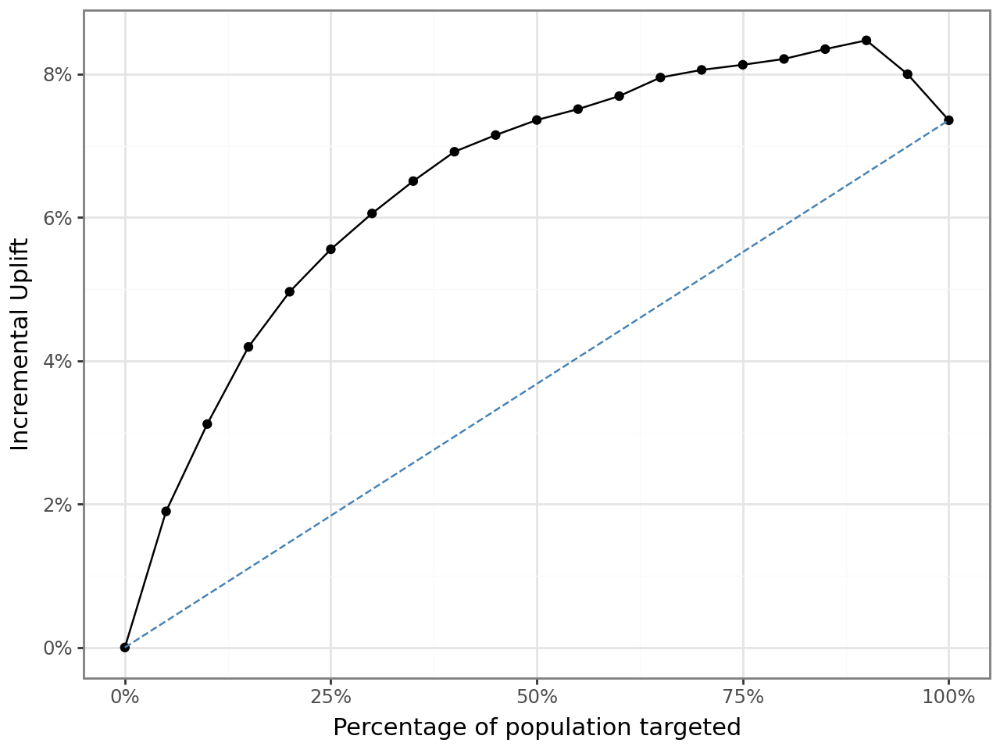

In [90]:
rsm.model.inc_uplift_plot(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    "uplift_rf_cv",
    "ad",
    1,
    qnt=20,
)


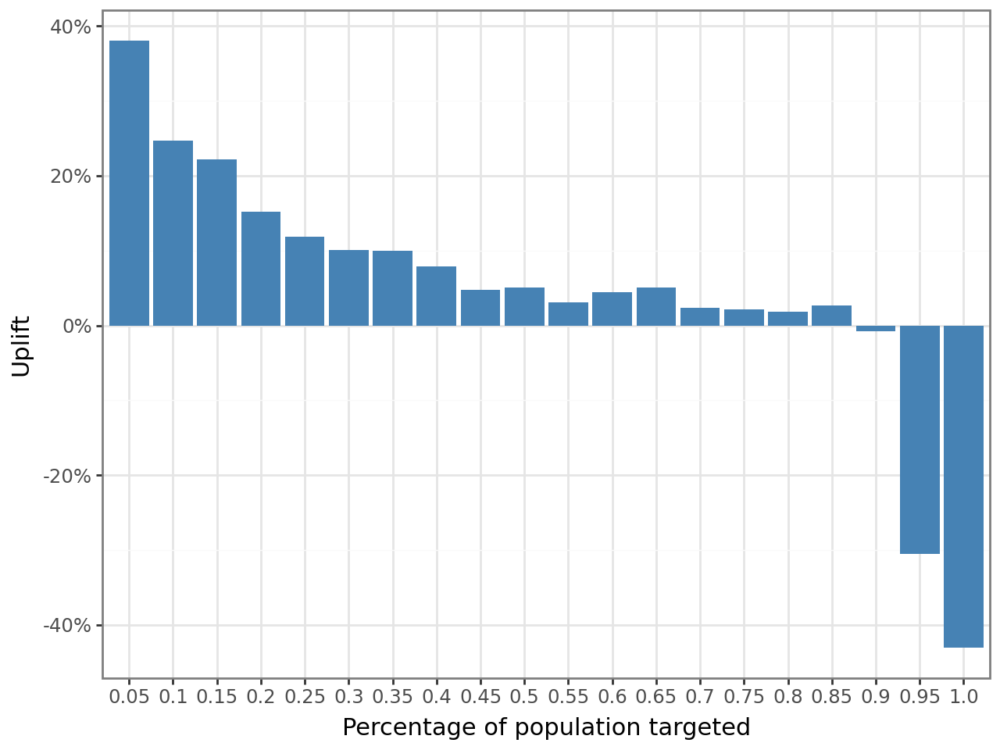

In [91]:
rsm.model.uplift_plot(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    "uplift_rf_cv",
    "ad",
    1,
    qnt=20,
)


In [92]:
inc_resp_25pct_rf_cv = tab_rf_cv.filter(pl.col("bins") == 5)["incremental_resp"].item()
test_ad_cust = 9000
scale_factor = 30000 / (test_ad_cust * 0.25)
inc_purch_rf_cv = inc_resp_25pct_rf_cv * scale_factor
rev_up_rf_cv = 14.99 * inc_purch_rf_cv
cost_up_rf_cv = 1.5 * 30000
incremental_profit_rf_cv = rev_up_rf_cv - cost_up_rf_cv

print(incremental_profit_rf_cv)

54930.271918307815


## XG Boost Model

In [93]:
clf_xgb_ctrl = rsm.model.xgboost(
    {
        "cg_rct_stacked_train": cg_rct_stacked.filter(
            (pl.col("training") == 1) & (pl.col("ad") == 0)
        )
    },
    rvar="converted",
    lev="yes",
    evar=evar,
    n_estimators=100,
    max_depth=6,
    min_child_weight=1,
    learning_rate=0.3,
    random_state=1234,
)
clf_xgb_ctrl.summary()

XGBoost
Data                 : cg_rct_stacked_train
Response variable    : converted
Level                : yes
Explanatory variables: GameLevel, NumGameDays, NumGameDays4Plus, NumInGameMessagesSent, NumSpaceHeroBadges, NumFriendRequestIgnored, NumFriends, AcquiredSpaceship, AcquiredIonWeapon, TimesLostSpaceship, TimesKilled, TimesCaptain, TimesNavigator, PurchasedCoinPackSmall, PurchasedCoinPackLarge, NumAdsClicked, DaysUser, UserConsole, UserHasOldOS
Model type           : classification
Nr. of features      : (19, 19)
Nr. of observations  : 21,000
n_estimators         : 100
max_depth            : 6
min_child_weight     : 1
learning_rate        : 0.3
subsample            : 1.0
colsample_bytree     : 1.0
random_state         : 1234
AUC                  : 0.993

Estimation data      :
shape: (5, 19)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬──────────┐
│ GameLevel ┆ NumGameDa ┆ NumGameDa ┆ NumInGame ┆ … ┆ Purchased ┆ Purchased ┆ UserConso 

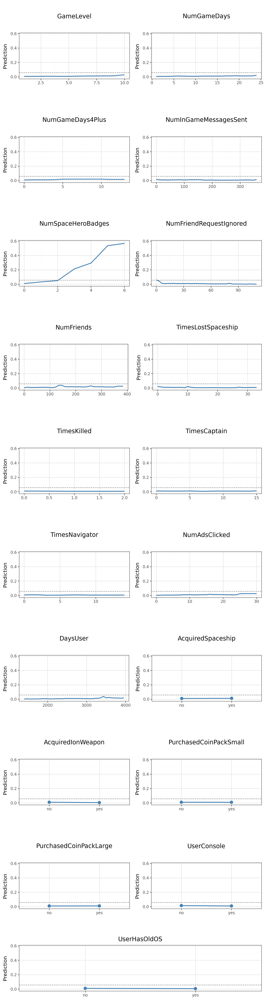

In [94]:
clf_xgb_ctrl.plot("pred")


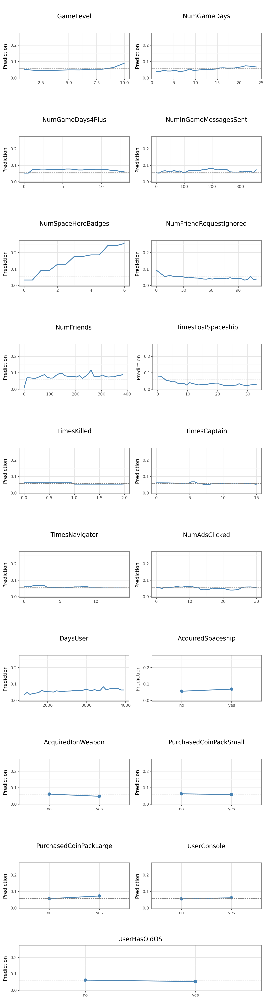

In [95]:
clf_xgb_ctrl.plot("pdp")


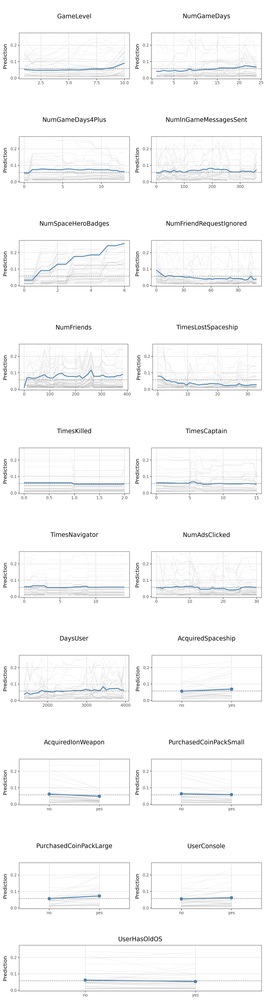

In [96]:
clf_xgb_ctrl.plot("pdp", ice=True)


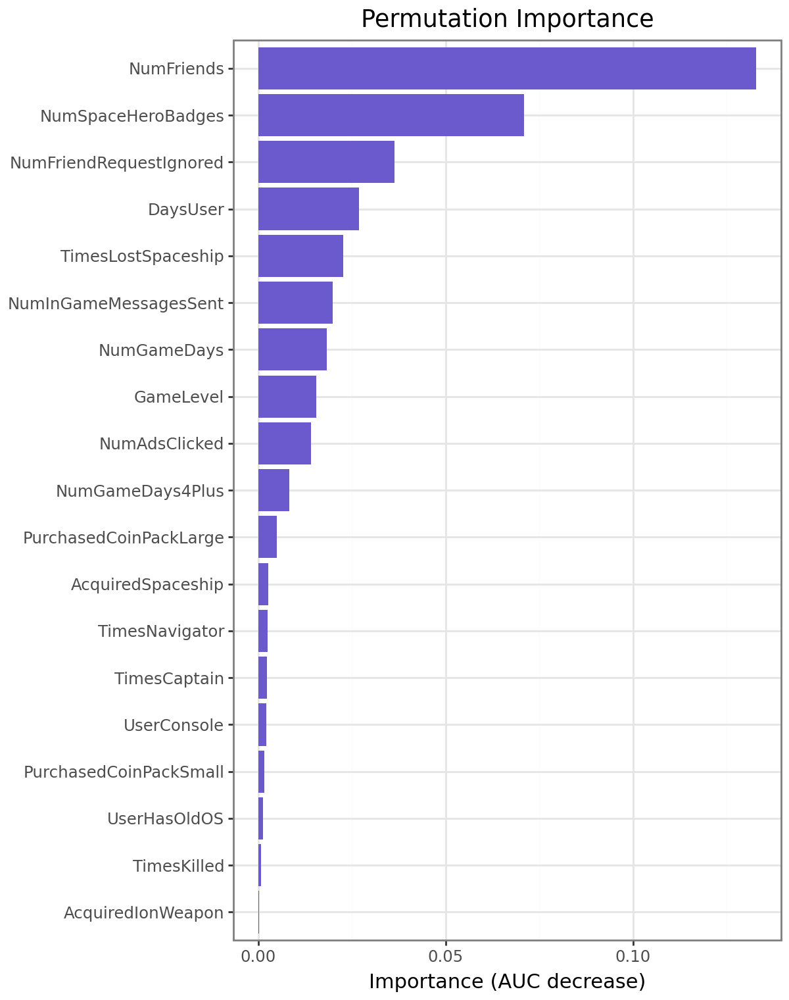

In [97]:
clf_xgb_ctrl.plot("pip")


In [98]:
clf_xgb_treat = rsm.model.xgboost(
    {
        "cg_rct_stacked_train": cg_rct_stacked.filter(
            (pl.col("training") == 1) & (pl.col("ad") == 1)
        )
    },
    rvar="converted",
    lev="yes",
    evar=evar,
    n_estimators=100,
    max_depth=6,
    min_child_weight=1,
    learning_rate=0.3,
    random_state=1234,
)
clf_xgb_treat.summary()


XGBoost
Data                 : cg_rct_stacked_train
Response variable    : converted
Level                : yes
Explanatory variables: GameLevel, NumGameDays, NumGameDays4Plus, NumInGameMessagesSent, NumSpaceHeroBadges, NumFriendRequestIgnored, NumFriends, AcquiredSpaceship, AcquiredIonWeapon, TimesLostSpaceship, TimesKilled, TimesCaptain, TimesNavigator, PurchasedCoinPackSmall, PurchasedCoinPackLarge, NumAdsClicked, DaysUser, UserConsole, UserHasOldOS
Model type           : classification
Nr. of features      : (19, 19)
Nr. of observations  : 21,000
n_estimators         : 100
max_depth            : 6
min_child_weight     : 1
learning_rate        : 0.3
subsample            : 1.0
colsample_bytree     : 1.0
random_state         : 1234
AUC                  : 0.954

Estimation data      :
shape: (5, 19)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬──────────┐
│ GameLevel ┆ NumGameDa ┆ NumGameDa ┆ NumInGame ┆ … ┆ Purchased ┆ Purchased ┆ UserConso 

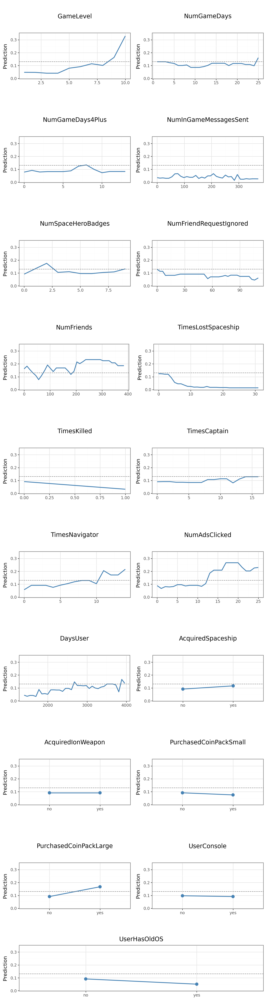

In [99]:
clf_xgb_treat.plot("pred")


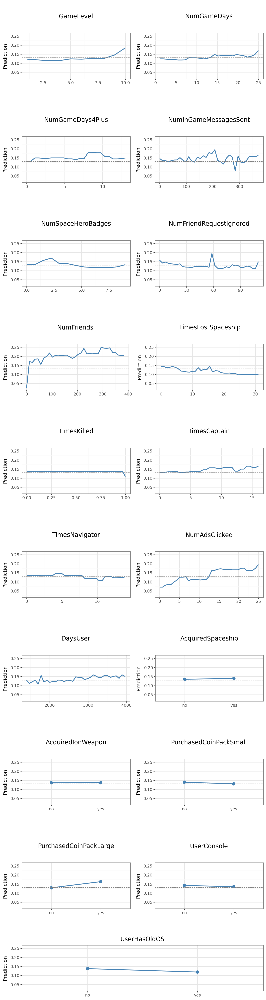

In [100]:
clf_xgb_treat.plot("pdp")


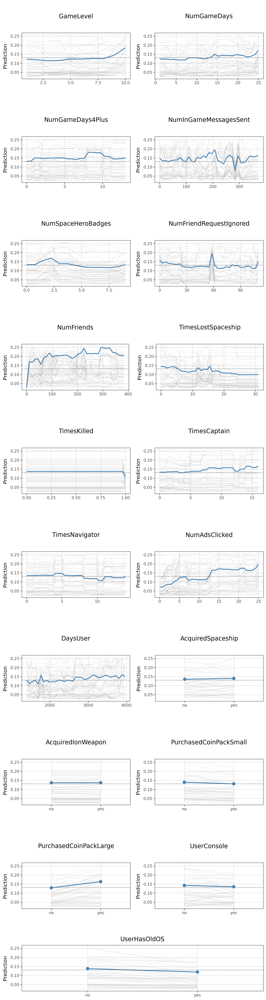

In [101]:
clf_xgb_treat.plot("pdp", ice=True)


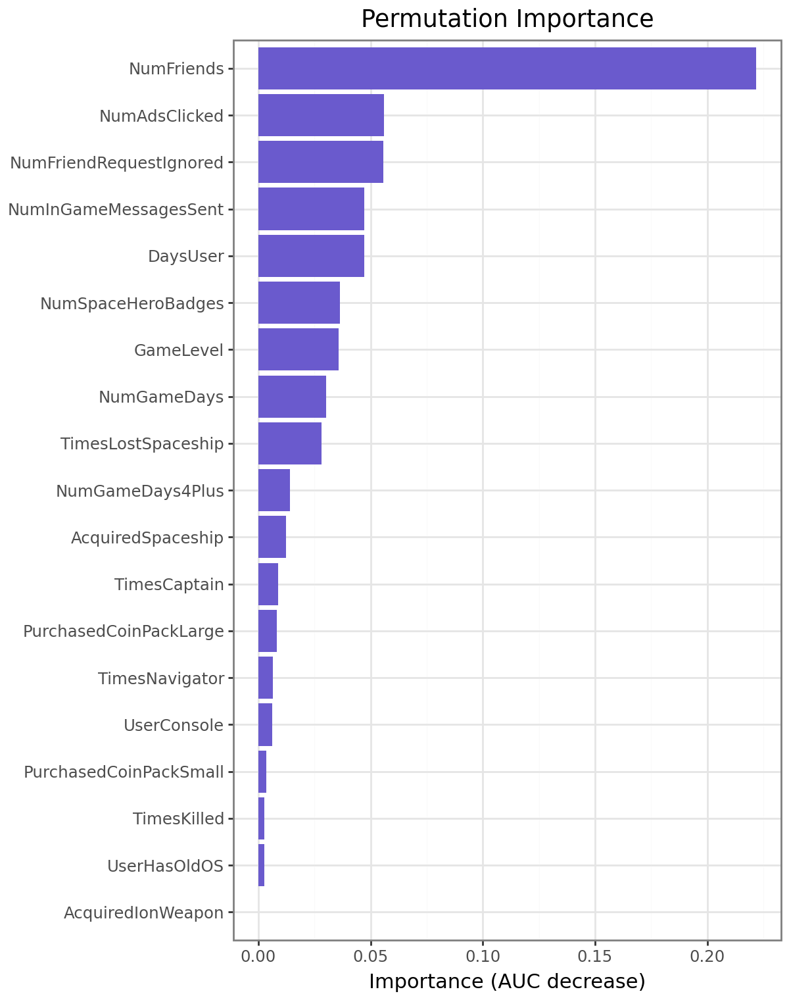

In [102]:
clf_xgb_treat.plot("pip")


In [103]:
cg_rct_stacked = cg_rct_stacked.with_columns(
    [
        pl.Series(
            "pred_treat_xgb", clf_xgb_treat.predict(cg_rct_stacked)["prediction"]
        ),
        pl.Series("pred_ctrl_xgb", clf_xgb_ctrl.predict(cg_rct_stacked)["prediction"]),
    ]
)


In [104]:
cg_rct_stacked = cg_rct_stacked.with_columns(
    (pl.col("pred_treat_xgb") - pl.col("pred_ctrl_xgb")).alias("uplift_xgb")
)
cg_rct_stacked

converted,GameLevel,NumGameDays,NumGameDays4Plus,NumInGameMessagesSent,NumSpaceHeroBadges,NumFriendRequestIgnored,NumFriends,AcquiredSpaceship,AcquiredIonWeapon,TimesLostSpaceship,TimesKilled,TimesCaptain,TimesNavigator,PurchasedCoinPackSmall,PurchasedCoinPackLarge,NumAdsClicked,DaysUser,UserConsole,UserHasOldOS,ad,training,pred_treatment,pred_control,uplift_score,pred_propensity,pred_treat_mlp,pred_ctrl_mlp,uplift_mlp,mlp_cv_treat,mlp_cv_ctrl,uplift_mlp_cv,pred_treat_rf,pred_ctrl_rf,uplift_rf,pred_rfcv_treat,pred_treat_rf_cv,pred_ctrl_rf_cv,uplift_rf_cv,pred_treat_xgb,pred_ctrl_xgb,uplift_xgb
cat,i32,i32,i32,i32,i32,i32,i32,cat,cat,i32,i32,i32,i32,cat,cat,i32,i32,cat,cat,i32,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f32,f32,f32
"""no""",7,18,0,124,0,81,0,"""yes""","""no""",8,0,0,4,"""no""","""yes""",3,2101,"""no""","""no""",0,1,0.082031,0.018729,0.063302,0.053649,0.007597,0.007333,0.000264,0.008,0.007,-0.001,0.02,0.0,0.02,0.0125,0.0125,0.005,0.0075,0.001413,0.000171,0.001242
"""no""",10,3,2,60,0,18,479,"""no""","""no""",10,7,0,0,"""yes""","""no""",7,1644,"""yes""","""no""",0,1,0.186298,0.03572,0.150578,0.106834,0.144713,0.037292,0.10742,0.145,0.037,-0.108,0.28,0.06,0.22,0.23,0.23,0.035,0.195,0.093518,0.003196,0.090322
"""no""",2,1,0,0,0,0,0,"""no""","""no""",0,0,0,2,"""no""","""no""",8,3197,"""yes""","""yes""",0,1,0.047125,0.012379,0.034746,0.030954,0.034659,0.009353,0.025306,0.035,0.009,-0.026,0.07,0.0,0.07,0.03,0.03,0.0,0.03,0.029434,0.000847,0.028587
"""no""",2,11,1,125,0,73,217,"""no""","""no""",0,0,0,0,"""yes""","""no""",6,913,"""no""","""no""",0,0,0.092398,0.010224,0.082174,0.045765,0.080824,0.007168,0.073655,0.081,0.007,-0.074,0.22,0.02,0.2,0.215,0.215,0.03,0.185,0.044588,0.001181,0.043407
"""no""",8,15,0,0,0,6,51,"""yes""","""no""",0,0,2,1,"""yes""","""no""",21,2009,"""yes""","""no""",0,1,0.307346,0.088581,0.218765,0.176762,0.294274,0.136737,0.157536,0.294,0.137,-0.157,0.31,0.0,0.31,0.3175,0.3175,0.02,0.2975,0.306901,0.016609,0.290292
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""no""",5,1,0,0,0,0,0,"""no""","""no""",0,0,0,0,"""yes""","""yes""",11,2374,"""no""","""no""",1,0,0.115326,0.024719,0.090608,0.068181,0.04193,0.00839,0.033541,0.042,0.008,-0.034,0.08,0.0,0.08,0.0375,0.0375,0.005,0.0325,0.025678,0.000425,0.025253
"""no""",9,12,0,78,0,59,1,"""yes""","""no""",16,0,0,5,"""yes""","""no""",2,1978,"""yes""","""no""",1,1,0.061149,0.01237,0.048779,0.040209,0.073642,0.007202,0.06644,0.074,0.007,-0.067,0.04,0.03,0.01,0.005,0.005,0.02,-0.015,0.003691,0.001583,0.002107
"""no""",9,19,1,271,0,71,95,"""yes""","""no""",14,0,0,3,"""no""","""no""",2,2831,"""yes""","""yes""",1,1,0.062747,0.021071,0.041676,0.046537,0.106722,0.017778,0.088944,0.107,0.018,-0.089,0.03,0.02,0.01,0.03,0.03,0.025,0.005,0.05515,0.008315,0.046834


In [105]:
tab_xgb = rsm.model.uplift_tab(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    "uplift_xgb",
    "ad",
    1,
    qnt=20,
)
tab_xgb


pred,bins,cum_prop,T_resp,T_n,C_resp,C_n,incremental_resp,inc_uplift,uplift
str,i64,f64,u32,u32,u32,u32,f64,f64,f64
"""uplift_xgb""",1,0.05,187,450,68,581,134.332186,1.49258,0.298516
"""uplift_xgb""",2,0.1,331,900,106,1098,244.114754,2.712386,0.246499
"""uplift_xgb""",3,0.15,449,1350,136,1612,335.104218,3.72338,0.203856
"""uplift_xgb""",4,0.2,550,1800,177,2146,401.537745,4.46153,0.147665
"""uplift_xgb""",5,0.25,632,2250,197,2687,467.039077,5.189323,0.145254
…,…,…,…,…,…,…,…,…,…
"""uplift_xgb""",16,0.8,989,7200,293,7797,718.434398,7.982604,0.01966
"""uplift_xgb""",17,0.85,1005,7650,299,8230,727.071689,8.078574,0.021699
"""uplift_xgb""",18,0.9,1075,8100,356,8633,740.979381,8.233104,0.014116


In [106]:
inc_resp_25pct_xgb = tab_xgb.filter(pl.col("bins") == 5)["incremental_resp"].item()
test_ad_cust = 9000
scale_factor = 30000 / (test_ad_cust * 0.25)
inc_purch_xgb = inc_resp_25pct_xgb * scale_factor
rev_up_xgb = 14.99 * inc_purch_xgb
cost_up_xgb = 1.5 * 30000
incremental_profit_xgb = rev_up_xgb - cost_up_xgb

print(incremental_profit_xgb)


48345.543530579336


## XG Boost Tuning

In [107]:
param_grid_xgb = {
    "n_estimators": [50, 100, 150],
    "max_depth": list(range(7)),
    "min_child_weight": [1, 5, 10],
    "learning_rate": [0.1, 0.2, 0.3],
}
scoring = {"AUC": "roc_auc"}
param_grid_xgb

{'n_estimators': [50, 100, 150],
 'max_depth': [0, 1, 2, 3, 4, 5, 6],
 'min_child_weight': [1, 5, 10],
 'learning_rate': [0.1, 0.2, 0.3]}

## Treatment Tuning

In [108]:
# cv_file = "cv-objects/clf-xgb-cross-validation-object.pkl"
# if os.path.exists(cv_file):
#     cv = rsm.notebook.load_state(cv_file)["cv"]
# else:
#     stratified_k_fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1234)
#     cv = GridSearchCV(
#         clf_xgb_treat.fitted,
#         param_grid,
#         scoring=scoring,
#         cv=stratified_k_fold,
#         n_jobs=4,
#         refit=list(scoring.keys())[0],
#         verbose=5,
#     ).fit(
#         clf_xgb_treat.data_onehot.to_pandas(),
#         clf_xgb_treat.data.get_column("converted"),
#     )
#     if not os.path.exists("cv-objects"):
#         os.mkdir("cv-objects")
#     rsm.notebook.save_state({"cv": cv}, cv_file)


In [109]:
cv_xgb_treat = rsm.model.cross_validation(
    rsm.model.xgboost(
        {
            "cg_rct_stacked_train": cg_rct_stacked.filter(
                (pl.col("training") == 1) & (pl.col("ad") == 1)
            )
        },
        rvar="converted",
        lev="yes",
        evar=evar,
    ),
    name="xgb_treat",
    param_grid=param_grid_xgb,
    scoring={"AUC": "roc_auc"},
)
# you had cg_rct_stacked: cg_rct_stacked_train - idk if this was for a reason but it wouldn't let the cell run

Fitting 5 folds for each of 189 candidates, totalling 945 fits
The best parameters are: {'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 10, 'n_estimators': 50}
The best model fit score is: 0.7800672253991467
The GirdSearchCV model fit estimates:
     mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
42       0.025475      0.000381         0.002283        0.000137   
51       0.029863      0.001533         0.002464        0.000164   
45       0.029421      0.000387         0.002219        0.000122   
35       0.045068      0.001650         0.002734        0.000143   
39       0.028821      0.007747         0.002550        0.000563   

    param_learning_rate  param_max_depth  param_min_child_weight  \
42                  0.1                4                      10   
51                  0.1                5                      10   
45                  0.1                5                       1   
35                  0.1                3                     

In [110]:
cv_xgb_treat.best_params_


{'learning_rate': 0.1,
 'max_depth': 4,
 'min_child_weight': 10,
 'n_estimators': 50}

In [111]:
cv_xgb_treat.best_score_


np.float64(0.7800672253991467)

In [112]:
pl.DataFrame(cv_xgb_treat.cv_results_).sort("rank_test_AUC")


mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_min_child_weight,param_n_estimators,params,split0_test_AUC,split1_test_AUC,split2_test_AUC,split3_test_AUC,split4_test_AUC,mean_test_AUC,std_test_AUC,rank_test_AUC
f64,f64,f64,f64,f64,i64,i64,i64,struct[4],f64,f64,f64,f64,f64,f64,f64,i32
0.025475,0.000381,0.002283,0.000137,0.1,4,10,50,"{0.1,4,10,50}",0.769916,0.773324,0.790158,0.77936,0.787577,0.780067,0.007839,1
0.029863,0.001533,0.002464,0.000164,0.1,5,10,50,"{0.1,5,10,50}",0.766486,0.772332,0.789535,0.782703,0.788771,0.779965,0.009128,2
0.029421,0.000387,0.002219,0.000122,0.1,5,1,50,"{0.1,5,1,50}",0.767795,0.771248,0.793426,0.781123,0.784101,0.779539,0.009196,3
0.045068,0.00165,0.002734,0.000143,0.1,3,10,150,"{0.1,3,10,150}",0.7731,0.771944,0.789298,0.775794,0.787232,0.779473,0.007315,4
0.028821,0.007747,0.00255,0.000563,0.1,4,5,50,"{0.1,4,5,50}",0.766393,0.774403,0.789761,0.781093,0.785497,0.779429,0.008265,5
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
0.151276,0.011076,0.01497,0.000302,0.2,0,10,150,"{0.2,0,10,150}",0.714834,0.736863,0.744632,0.732932,0.734434,0.732739,0.009818,185
0.102305,0.008298,0.010192,0.000207,0.3,0,10,100,"{0.3,0,10,100}",0.718815,0.732778,0.743934,0.73926,0.725463,0.73205,0.009081,186
0.139984,0.005067,0.011267,0.000192,0.3,0,5,100,"{0.3,0,5,100}",0.712106,0.722019,0.741032,0.744829,0.733751,0.730747,0.012139,187


In [113]:
clf_xgbcv_treat = rsm.model.xgboost(
    {
        "cg_rct_stacked_train": cg_rct_stacked.filter(
            (pl.col("training") == 1) & (pl.col("ad") == 1)
        )
    },
    rvar="converted",
    lev="yes",
    evar=evar,
    random_state=1234,
    **cv_xgb_treat.best_params_,
)
clf_xgbcv_treat.summary()


XGBoost
Data                 : cg_rct_stacked_train
Response variable    : converted
Level                : yes
Explanatory variables: GameLevel, NumGameDays, NumGameDays4Plus, NumInGameMessagesSent, NumSpaceHeroBadges, NumFriendRequestIgnored, NumFriends, AcquiredSpaceship, AcquiredIonWeapon, TimesLostSpaceship, TimesKilled, TimesCaptain, TimesNavigator, PurchasedCoinPackSmall, PurchasedCoinPackLarge, NumAdsClicked, DaysUser, UserConsole, UserHasOldOS
Model type           : classification
Nr. of features      : (19, 19)
Nr. of observations  : 21,000
n_estimators         : 50
max_depth            : 4
min_child_weight     : 10
learning_rate        : 0.1
subsample            : 1.0
colsample_bytree     : 1.0
random_state         : 1234
AUC                  : 0.807

Estimation data      :
shape: (5, 19)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬──────────┐
│ GameLevel ┆ NumGameDa ┆ NumGameDa ┆ NumInGame ┆ … ┆ Purchased ┆ Purchased ┆ UserConso 

## Control Tuning

In [114]:
cv_xgb_ctrl = rsm.model.cross_validation(
    rsm.model.xgboost(
        {
            # "cg_rct_stacked": {
            "cg_rct_stacked_train": cg_rct_stacked.filter(
                (pl.col("training") == 1) & (pl.col("ad") == 0)
            )
        },
        # },
        rvar="converted",
        lev="yes",
        evar=evar,
    ),
    name="xgb_treat",
    param_grid=param_grid_xgb,
    scoring={"AUC": "roc_auc"},
)


The best parameters are: {'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 10, 'n_estimators': 50}
The best model fit score is: 0.7800672253991467
The GirdSearchCV model fit estimates:
     mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
42       0.025475      0.000381         0.002283        0.000137   
51       0.029863      0.001533         0.002464        0.000164   
45       0.029421      0.000387         0.002219        0.000122   
35       0.045068      0.001650         0.002734        0.000143   
39       0.028821      0.007747         0.002550        0.000563   

    param_learning_rate  param_max_depth  param_min_child_weight  \
42                  0.1                4                      10   
51                  0.1                5                      10   
45                  0.1                5                       1   
35                  0.1                3                      10   
39                  0.1                4                

In [115]:
cv_xgb_ctrl.best_params_


{'learning_rate': 0.1,
 'max_depth': 4,
 'min_child_weight': 10,
 'n_estimators': 50}

In [116]:
cv_xgb_ctrl.best_score_


np.float64(0.7800672253991467)

In [117]:
pl.DataFrame(cv_xgb_ctrl.cv_results_).sort("rank_test_AUC")


mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_min_child_weight,param_n_estimators,params,split0_test_AUC,split1_test_AUC,split2_test_AUC,split3_test_AUC,split4_test_AUC,mean_test_AUC,std_test_AUC,rank_test_AUC
f64,f64,f64,f64,f64,i64,i64,i64,struct[4],f64,f64,f64,f64,f64,f64,f64,i32
0.025475,0.000381,0.002283,0.000137,0.1,4,10,50,"{0.1,4,10,50}",0.769916,0.773324,0.790158,0.77936,0.787577,0.780067,0.007839,1
0.029863,0.001533,0.002464,0.000164,0.1,5,10,50,"{0.1,5,10,50}",0.766486,0.772332,0.789535,0.782703,0.788771,0.779965,0.009128,2
0.029421,0.000387,0.002219,0.000122,0.1,5,1,50,"{0.1,5,1,50}",0.767795,0.771248,0.793426,0.781123,0.784101,0.779539,0.009196,3
0.045068,0.00165,0.002734,0.000143,0.1,3,10,150,"{0.1,3,10,150}",0.7731,0.771944,0.789298,0.775794,0.787232,0.779473,0.007315,4
0.028821,0.007747,0.00255,0.000563,0.1,4,5,50,"{0.1,4,5,50}",0.766393,0.774403,0.789761,0.781093,0.785497,0.779429,0.008265,5
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
0.151276,0.011076,0.01497,0.000302,0.2,0,10,150,"{0.2,0,10,150}",0.714834,0.736863,0.744632,0.732932,0.734434,0.732739,0.009818,185
0.102305,0.008298,0.010192,0.000207,0.3,0,10,100,"{0.3,0,10,100}",0.718815,0.732778,0.743934,0.73926,0.725463,0.73205,0.009081,186
0.139984,0.005067,0.011267,0.000192,0.3,0,5,100,"{0.3,0,5,100}",0.712106,0.722019,0.741032,0.744829,0.733751,0.730747,0.012139,187


In [118]:
clf_xgbcv_ctrl = rsm.model.xgboost(
    {
        "cg_rct_stacked_train": cg_rct_stacked.filter(
            (pl.col("training") == 1) & (pl.col("ad") == 0)
        )
    },
    rvar="converted",
    lev="yes",
    evar=evar,
    random_state=1234,
    **cv_xgb_ctrl.best_params_,
)
clf_xgbcv_ctrl.summary()


XGBoost
Data                 : cg_rct_stacked_train
Response variable    : converted
Level                : yes
Explanatory variables: GameLevel, NumGameDays, NumGameDays4Plus, NumInGameMessagesSent, NumSpaceHeroBadges, NumFriendRequestIgnored, NumFriends, AcquiredSpaceship, AcquiredIonWeapon, TimesLostSpaceship, TimesKilled, TimesCaptain, TimesNavigator, PurchasedCoinPackSmall, PurchasedCoinPackLarge, NumAdsClicked, DaysUser, UserConsole, UserHasOldOS
Model type           : classification
Nr. of features      : (19, 19)
Nr. of observations  : 21,000
n_estimators         : 50
max_depth            : 4
min_child_weight     : 10
learning_rate        : 0.1
subsample            : 1.0
colsample_bytree     : 1.0
random_state         : 1234
AUC                  : 0.907

Estimation data      :
shape: (5, 19)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬──────────┐
│ GameLevel ┆ NumGameDa ┆ NumGameDa ┆ NumInGame ┆ … ┆ Purchased ┆ Purchased ┆ UserConso 

In [119]:
cg_rct_stacked = cg_rct_stacked.with_columns(
    [
        pl.Series(
            "pred_treat_xgb_cv", clf_xgbcv_treat.predict(cg_rct_stacked)["prediction"]
        ),
        pl.Series(
            "pred_ctrl_xgb_cv", clf_xgbcv_ctrl.predict(cg_rct_stacked)["prediction"]
        ),
    ]
)


In [120]:
cg_rct_stacked = cg_rct_stacked.with_columns(
    (pl.col("pred_treat_xgb_cv") - pl.col("pred_ctrl_xgb_cv")).alias("uplift_xgb_cv")
)


In [121]:
tab_xgb_cv = rsm.model.uplift_tab(
    cg_rct_stacked.filter(pl.col("training") == 0),
    "converted",
    "yes",
    "uplift_xgb_cv",
    "ad",
    1,
    qnt=20,
)


In [122]:
inc_resp_25pct_xgb_cv = tab_xgb_cv.filter(pl.col("bins") == 5)[
    "incremental_resp"
].item()
test_ad_cust = 9000
scale_factor = 30000 / (test_ad_cust * 0.25)
inc_purch_xgb_cv = inc_resp_25pct_xgb_cv * scale_factor
rev_up_xgb_cv = 14.99 * inc_purch_xgb_cv
cost_up_xgb_cv = 1.5 * 30000
incremental_profit_xgb_cv = rev_up_xgb_cv - cost_up_xgb_cv

print(incremental_profit_xgb_cv)


56582.78403134951


# Part 2: Targeting Optimal Proportion of Customers

### 2.1 
What formula would you use to select customers to target using propensity model if our goal is to maximize expected profits? 
What percentage of customers in the ad treatment test set in cg_rct_stacked would you target based on propensity model?

In [123]:
cg_rct_stacked

converted,GameLevel,NumGameDays,NumGameDays4Plus,NumInGameMessagesSent,NumSpaceHeroBadges,NumFriendRequestIgnored,NumFriends,AcquiredSpaceship,AcquiredIonWeapon,TimesLostSpaceship,TimesKilled,TimesCaptain,TimesNavigator,PurchasedCoinPackSmall,PurchasedCoinPackLarge,NumAdsClicked,DaysUser,UserConsole,UserHasOldOS,ad,training,pred_treatment,pred_control,uplift_score,pred_propensity,pred_treat_mlp,pred_ctrl_mlp,uplift_mlp,mlp_cv_treat,mlp_cv_ctrl,uplift_mlp_cv,pred_treat_rf,pred_ctrl_rf,uplift_rf,pred_rfcv_treat,pred_treat_rf_cv,pred_ctrl_rf_cv,uplift_rf_cv,pred_treat_xgb,pred_ctrl_xgb,uplift_xgb,pred_treat_xgb_cv,pred_ctrl_xgb_cv,uplift_xgb_cv
cat,i32,i32,i32,i32,i32,i32,i32,cat,cat,i32,i32,i32,i32,cat,cat,i32,i32,cat,cat,i32,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f32,f32,f32,f32,f32,f32
"""no""",7,18,0,124,0,81,0,"""yes""","""no""",8,0,0,4,"""no""","""yes""",3,2101,"""no""","""no""",0,1,0.082031,0.018729,0.063302,0.053649,0.007597,0.007333,0.000264,0.008,0.007,-0.001,0.02,0.0,0.02,0.0125,0.0125,0.005,0.0075,0.001413,0.000171,0.001242,0.009792,0.004209,0.005583
"""no""",10,3,2,60,0,18,479,"""no""","""no""",10,7,0,0,"""yes""","""no""",7,1644,"""yes""","""no""",0,1,0.186298,0.03572,0.150578,0.106834,0.144713,0.037292,0.10742,0.145,0.037,-0.108,0.28,0.06,0.22,0.23,0.23,0.035,0.195,0.093518,0.003196,0.090322,0.167329,0.029283,0.138046
"""no""",2,1,0,0,0,0,0,"""no""","""no""",0,0,0,2,"""no""","""no""",8,3197,"""yes""","""yes""",0,1,0.047125,0.012379,0.034746,0.030954,0.034659,0.009353,0.025306,0.035,0.009,-0.026,0.07,0.0,0.07,0.03,0.03,0.0,0.03,0.029434,0.000847,0.028587,0.030286,0.004668,0.025618
"""no""",2,11,1,125,0,73,217,"""no""","""no""",0,0,0,0,"""yes""","""no""",6,913,"""no""","""no""",0,0,0.092398,0.010224,0.082174,0.045765,0.080824,0.007168,0.073655,0.081,0.007,-0.074,0.22,0.02,0.2,0.215,0.215,0.03,0.185,0.044588,0.001181,0.043407,0.1163,0.019321,0.096979
"""no""",8,15,0,0,0,6,51,"""yes""","""no""",0,0,2,1,"""yes""","""no""",21,2009,"""yes""","""no""",0,1,0.307346,0.088581,0.218765,0.176762,0.294274,0.136737,0.157536,0.294,0.137,-0.157,0.31,0.0,0.31,0.3175,0.3175,0.02,0.2975,0.306901,0.016609,0.290292,0.249671,0.044322,0.205349
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""no""",5,1,0,0,0,0,0,"""no""","""no""",0,0,0,0,"""yes""","""yes""",11,2374,"""no""","""no""",1,0,0.115326,0.024719,0.090608,0.068181,0.04193,0.00839,0.033541,0.042,0.008,-0.034,0.08,0.0,0.08,0.0375,0.0375,0.005,0.0325,0.025678,0.000425,0.025253,0.029324,0.003287,0.026037
"""no""",9,12,0,78,0,59,1,"""yes""","""no""",16,0,0,5,"""yes""","""no""",2,1978,"""yes""","""no""",1,1,0.061149,0.01237,0.048779,0.040209,0.073642,0.007202,0.06644,0.074,0.007,-0.067,0.04,0.03,0.01,0.005,0.005,0.02,-0.015,0.003691,0.001583,0.002107,0.059941,0.022068,0.037873
"""no""",9,19,1,271,0,71,95,"""yes""","""no""",14,0,0,3,"""no""","""no""",2,2831,"""yes""","""yes""",1,1,0.062747,0.021071,0.041676,0.046537,0.106722,0.017778,0.088944,0.107,0.018,-0.089,0.03,0.02,0.01,0.03,0.03,0.025,0.005,0.05515,0.008315,0.046834,0.084102,0.029582,0.05452


In [124]:
# formula
threshold = 1.50 / 14.99
test_set = cg_rct_stacked.filter(pl.col("training") == 0)
prop_optimal_pct = test_set.select(
    (pl.col("pred_propensity") > threshold).mean()
).item()

test_set, prop_optimal_pct

# 28.7% is the optimal

(shape: (18_000, 45)
 ┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬──────────┐
 │ converted ┆ GameLevel ┆ NumGameDa ┆ NumGameDa ┆ … ┆ uplift_xg ┆ pred_trea ┆ pred_ctrl ┆ uplift_x │
 │ ---       ┆ ---       ┆ ys        ┆ ys4Plus   ┆   ┆ b         ┆ t_xgb_cv  ┆ _xgb_cv   ┆ gb_cv    │
 │ cat       ┆ i32       ┆ ---       ┆ ---       ┆   ┆ ---       ┆ ---       ┆ ---       ┆ ---      │
 │           ┆           ┆ i32       ┆ i32       ┆   ┆ f32       ┆ f32       ┆ f32       ┆ f32      │
 ╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪═══════════╪═══════════╪══════════╡
 │ no        ┆ 2         ┆ 11        ┆ 1         ┆ … ┆ 0.043407  ┆ 0.1163    ┆ 0.019321  ┆ 0.096979 │
 │ no        ┆ 7         ┆ 16        ┆ 0         ┆ … ┆ 0.069043  ┆ 0.112762  ┆ 0.018097  ┆ 0.094665 │
 │ no        ┆ 8         ┆ 8         ┆ 0         ┆ … ┆ 0.025716  ┆ 0.087632  ┆ 0.009859  ┆ 0.077773 │
 │ no        ┆ 1         ┆ 5         ┆ 0         ┆ … ┆ 0.0211

### 2.2
What formula would you use to select customers to target using an uplift model if our goal is to maximize incremental profits? 
What percentage of customers in the ad treatment test set in cg_rct_stacked would you target based on an uplift model?

In [125]:
uplift_optimal_pct = test_set.select((pl.col("uplift_score") > threshold).mean()).item()
uplift_optimal_pct

# 24.23% is the optimal percent to target

0.24233333333333335

### 2.3 
Extrapolate incremental profits it targeting optimal percentage of customers out of 120k as suggested by propensity and uplift model

In [126]:
# function to re-use on next several calculations
def calc_optimal_profit(model_name, opt_pct, utab):
    # Round to nearest 5% and find the target bin
    target_bin = int(round(opt_pct * 20))

    # Sum the incremental_resp from bin 1 up to the target_bin
    # This gives us the total additional sales generated by the ads
    total_inc_resp = (
        utab.filter(pl.col("bins") <= target_bin)
        .select(pl.col("incremental_resp").sum())
        .item()
    )

    # Scaling to 120,000 population
    # scale = Total Population / Size of the Test Set
    scale_factor = 120_000 / test_set.height

    # Calculate Revenue and Costs
    total_inc_revenue = total_inc_resp * scale_factor * 14.99

    # targeted_pop is the number of people we sent ads to in the 120k group
    targeted_pop = (target_bin / 20) * 120_000
    total_ad_cost = targeted_pop * 1.50

    final_profit = total_inc_revenue - total_ad_cost

    print(f"{model_name}: Target {target_bin * 5}% | Profit: ${final_profit:,.2f}")
    return final_profit

In [127]:
profit_prop_logit = calc_optimal_profit(
    "Propensity Logit", prop_optimal_pct, uplift_tab_prop
)
profit_uplift_logit = calc_optimal_profit("Uplift Logit", uplift_optimal_pct, tab)


Propensity Logit: Target 30% | Profit: $36,761.90
Uplift Logit: Target 25% | Profit: $111,485.08


### 2.4
Repeat for Neural Network

In [141]:
mlp_opt_pct = test_set.select((pl.col("uplift_mlp_cv") > threshold).mean()).item()
profit_mlp = calc_optimal_profit("NN Uplift", mlp_opt_pct, tab_mlp_cv)


NN Uplift: Target 10% | Profit: $22,859.16


### 2.5
Repeat for Random Forest

In [129]:
rf_opt_pct = test_set.select((pl.col("uplift_rf_cv") > threshold).mean()).item()
profit_rf = calc_optimal_profit("RF Uplift", rf_opt_pct, tab_rf_cv)

# says to target 0 - i think the cell that uses tab_rf_cv has problems with the .item() thing - is it actually saying to target no one?


RF Uplift: Target 35% | Profit: $227,409.87


### 2.6
Repeat for TUNED XGBoost

In [130]:
xgb_opt_pct = test_set.select((pl.col("uplift_xgb_cv") > threshold).mean()).item()
profit_xgb = calc_optimal_profit("XGB Uplift", xgb_opt_pct, tab_xgb_cv)

XGB Uplift: Target 30% | Profit: $173,013.21
